# Notebook para los códigos del TFG

## Librerias necesarias

### Instalamos las librerias

In [ ]:
#%pip install pandas
#%pip install pysr

In [ ]:
%lsmagic

### Importamos las librerias

In [2]:
import pandas as pd
#from pysr import PySRRegressor De momento no lo estoy usando
import seaborn as sns
import numpy as np
#from ydata_profiling import ProfileReport
from dcor import distance_correlation
import os
import matplotlib.pyplot as plt


### Funciones

In [2]:
def plot2d(df, x, y, dire,n):
    # Ensure the directory exists before saving
    os.makedirs(dire, exist_ok=True)

    # Configurar el estilo científico
    sns.set_theme(style="whitegrid", font_scale=1.5, context="paper")

    # Crear la figura y los ejes compartiendo el eje Y
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(40, 10), dpi=300, sharey=True, gridspec_kw={'wspace': 0.1})

    if  np.any(df[x] <= 0):
        ax1.scatter(df[x], df[y], color='red', s=30)
        ax1.set_xlabel(f"{x}", fontsize=14)
        ax1.set_xscale("log")
        log_corr = 0.0
    else:
    # Scatter plot con escala logarítmica (Izquierda)
        ax1.scatter(np.log10(df[x]), df[y], color='red', s=30)
        ax1.set_xlabel(r"$\log_{10}$"+f"{x}", fontsize=14)
        log_corr = distance_correlation(np.log10(df[x]), df[y])
    
    ax1.set_title("Escala Logarítmica", fontsize=16)
    ax1.grid(True, which="both", linestyle="--", linewidth=0.5)
    ax1.set_ylabel(f"{y}", fontsize=14)

    
    linear_corr = distance_correlation(df[x], df[y])
    
    fig.suptitle(f"Corr. Lineal: {linear_corr:.2f}\nCorr. Logarítmica: {log_corr:.2f}", fontsize=16)

    # Scatter plot con escala lineal (Derecha)
    ax2.scatter(df[x], df[y], color='red', s=30)
    ax2.set_xscale("linear")
    ax2.set_title("Escala Lineal ", fontsize=16)
    ax2.grid(True, linestyle="--", linewidth=0.5)
    ax2.set_xlabel(f"{x}", fontsize=14)

    # Ajustar los límites del eje Y para coherencia visual
    ax1.set_ylim(-1.05 * min(df[y]), 1.05 * max(df[y]))
    ax2.set_ylim(-1.05 * min(df[y]), 1.05 * max(df[y]))

    # Construir el nombre del archivo
    filename = f"plot2d_{n}.png"
    if abs(linear_corr) < 0.5 or abs(log_corr) < 0.5:
        filepath = None
    else:
        if not dire.startswith("D:/"):
            dira = os.path.join("D:/", dire)  # Properly join paths
        else:
            dira = dire  # Avoid prefixing "D:/" again

        os.makedirs(dira, exist_ok=True)  # Create directory safely
        dire = dira
        filepath = os.path.join(dire, filename)
    if filepath is not None:
    # Guardar la imagen en alta calidad
        plt.savefig(filepath, dpi=300, bbox_inches="tight")

        # Cerrar la gráfica para liberar memoria
        plt.close()
    else:
        plt.close()
        print("No se guardó el gráfico debido a la baja correlación.")

In [ ]:
def plot3d(df, x, y, z,dire,n):
    import matplotlib.pyplot as plt
    import seaborn as sns
    import pandas as pd
    import numpy as np
    from mpl_toolkits.mplot3d import Axes3D
    from sklearn.decomposition import PCA
    from sklearn.preprocessing import StandardScaler
    os.makedirs(dire, exist_ok=True)
    # Configurar estilo científico
    sns.set_theme(style="whitegrid", font_scale=1.2, context="paper")
    scope = df[[x, y, z]]

    # Aplicar transformación logarítmica a los datos
    if np.any(scope[z] <= 0) or np.any(scope[x] <= 0) or np.any(scope[y] <= 0):

        df_log_x = scope.copy()
        df_log_y = scope.copy()
        df_log_z = scope.copy()
        data_variants = [
        (df_log_x, f"{x} ", f"{y}", f"{z}"),
        (df_log_y, f"{x}", f"{y} ", f"{z}"),
        (df_log_z, f"{x}", f"{y}", f"{z} ")
    ]
    else:
        df_log_x = scope.copy()
        df_log_x[x] = np.log10(df_log_x[x])

        df_log_y = scope.copy()
        df_log_y[y] = np.log10(df_log_y[y])

        df_log_z = scope.copy()
        df_log_z[z] = np.log10(df_log_z[z])
        data_variants = [
        (df_log_x, r"$\log_{10}$"+f"{x} ", f"{y}", f"{z}"),
        (df_log_y, f"{x}", r"$\log_{10}$"+f"{y} ", f"{z}"),
        (df_log_z, f"{x}", f"{y}", r"$\log_{10}$"+f"{z} ")
    ]
    # Crear figura
    

    # Definir títulos y datos transformados
    

    # Iterar sobre cada gráfica
    for ax, (data, xaxis,yaxis,zaxis) in zip(axes, data_variants):
        for i in [x,y,z]:
            df[i] = pd.to_numeric(df[i], errors="coerce")  # Converts to NaN if not numeric
            df[i] = df[i].astype(float)  # Ensures numeric type
            data[i] = pd.to_numeric(data[i], errors="coerce")  # Converts to NaN if not numeric
            data[i] = data[i].astype(float)  # Ensures numeric type
        scaler = StandardScaler()
        points = np.vstack((data[x], data[y], data[z])).T
        points_normalized = scaler.fit_transform(points)

        # Aplicar PCA para encontrar la dimensión del subespacio donde viven los datos
        pca = PCA(n_components=3)
        pca.fit(points_normalized)
        linear_corr = distance_correlation(df[[x,y]], df[z])
        log_corr = distance_correlation(data[[x,y]], data[z])

    
        # Si el tercer autovalor es muy pequeño, significa que los datos son casi planos
        explained_variance = pca.explained_variance_ratio_
        plane_detected = explained_variance[2] < 1e-6  # Umbral arbitrario para detectar planitud
        
        if plane_detected:
            # Obtener vector normal al plano (última componente de PCA)
            fig = plt.figure(figsize=(40, 10), dpi=300)
            axes = [fig.add_subplot(1, 3, i + 1, projection='3d') for i in range(3)]
            ax.text2D(0.05, 0.95, f"Corr. Lineal: {linear_corr:.2f}\nCorr. Logarítmica: {log_corr:.2f}", fontsize=12, verticalalignment='top', transform=ax.transAxes)
            normal_vector = pca.components_[2]
            # Crear una malla de puntos para graficar el plano
            xx, yy = np.meshgrid(np.linspace(min(data[x]), max(data[x]), 10), 
                                 np.linspace(min(data[y]), max(data[y]), 10))
            d = -np.dot(normal_vector, pca.mean_)  # Constante del plano
            zz = (-normal_vector[0] * xx - normal_vector[1] * yy - d) / normal_vector[2]

            # Graficar plano
            ax.plot_surface(xx, yy, zz, alpha=0.25, color='gray', edgecolor='black')

            ax.set_title(f"Plano Detectado en los Datos")
            if not dire.startswith("D:/"):
                dira = os.path.join("D:/", dire)  # Properly join paths
            else:
                dira = dire  # Avoid prefixing "D:/" again
        else:
            
            dire= None

            


        # Asegurar que siempre se grafican los puntos
        ax.scatter(data[x], data[y], data[z], color='red', s=20)
        ax.set_xlabel(xaxis)
        ax.set_ylabel(yaxis)
        ax.set_zlabel(zaxis)
        ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
        ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
        ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))

    plt.tight_layout()
    filename = f"plot3d_{n}.png"
    if dire is not None:
        os.makedirs(dira, exist_ok=True)  # Create directory safely
        filepath = os.path.join(dire, filename)

    # Guardar la imagen en alta calidad
        plt.savefig(filepath, dpi=300, bbox_inches="tight")
        plt.close() 
    else:
        plt.close()
        print("Imagen no guardada.") 
    


## Preprocesamiento de datos

### Abrir los archivos

#### Abrimos el archivo physical properties

In [4]:
physical_properties = 'Data/raw/hlsp_candels_hst_wfc3_egs_multi_v1_physpar-cat.txt'

phys_prop_data = pd.read_csv(physical_properties, sep='\s+', header=None, skiprows=123)



#A continuación añadimos las columnas

phys_prop_data.columns = ["ID",
"age_2a_tau (dex(yr))" ,
"tau_2a_tau (Gyr)" ,
"Av_2a_tau (mag)" ,
"SFR_2a_tau (solMass/yr)" ,
"chi2_2a_tau ",
"age_4b (dex(yr))" ,
"EBV_4b (mag)" ,
"age_6a_tau (dex(yr))" ,
"tau_6a_tau (Gyr)" ,
"EBV_6a_tau (mag)" ,
"SFR_6a_tau (solMass/yr)" ,
"met_6a_tau (solMet)" ,
"extlw_6a_tau ",
"chi2_6a_tau ",
"L1400_6a_tau (erg/s/Hz)" ,
"L2700_6a_tau (erg/s/Hz)" ,
"UMag_6a_tau (mag)" ,
"BMag_6a_tau (mag)" ,
"VMag_6a_tau (mag)" ,
"RMag_6a_tau (mag)" ,
"IMag_6a_tau (mag)" ,
"JMag_6a_tau (mag)" ,
"KMag_6a_tau (mag)" ,
"age_10c (dex(yr))" ,
"SFH_10c ",
"tau_10c (Gyr)" ,
"met_10c (solMet)" ,
"M_l99_11a_tau (dex(solMass))",
 "M_u99_11a_tau (dex(solMass))",
 "age_11a_tau (dex(yr))" ,
"SFR_11a_tau (solMass/yr)" ,
"M_l68_12a (dex(solMass))",
"M_u68_12a (dex(solMass))",
 "M_l95_12a (dex(solMass))",
 "M_u95_12a (dex(solMass))",
 "age_12a (dex(yr))" ,
"tau_12a (Gyr)" ,
"EBV_12a (mag)" ,
"met_12a (solMet)" ,
"Lbol_12a (dex(solLum))" ,
"chi2_12a ",
"age_13a_tau (dex(yr))" ,
"tau_13a_tau (Gyr)" ,
"Av_13a_tau (mag)" ,
"SFR_13a_tau (solMass/yr)" ,
"chi2_13a_tau ",
"age_14a (dex(yr))" ,
"SFH_14a ",
"tau_14a (Gyr)" ,
"EBV_14a (mag)" ,
"SFR_14a (solMass/yr)" ,
"q_14a ",
"age_6a_tau ^NEB (dex(yr))" ,
"tau_6a_tau ^NEB (Gyr)" ,
"EBV_6a_tau ^NEB (mag)" ,
"SFR_6a_tau ^NEB (solMass/yr)" ,
"met_6a_tau ^NEB (solMet)" ,
"extlw_6a_tau ^NEB ",
"chi2_6a_tau ^NEB ",
"L1400_6a_tau ^NEB (erg/s/Hz)" ,
"L2700_6a_tau ^NEB (erg/s/Hz)" ,
"UMag_6a_tau ^NEB (mag)" ,
"BMag_6a_tau ^NEB (mag)" ,
"VMag_6a_tau ^NEB (mag)" ,
"RMag_6a_tau ^NEB (mag)" ,
"IMag_6a_tau ^NEB (mag)" ,
"JMag_6a_tau ^NEB (mag)" ,
"KMag_6a_tau ^NEB (mag)" ,
"age_6a_deltau (dex(yr))" ,
"tau_6a_deltau (Gyr)" ,
"EBV_6a_deltau (mag)" ,
"SFR_6a_deltau (solMass/yr)" ,
"met_6a_deltau (solMet)" ,
"extlw_6a_deltau ",
"chi2_6a_deltau ",
"L1400_6a_deltau (erg/s/Hz)" ,
"L2700_6a_deltau (erg/s/Hz)" ,
"UMag_6a_deltau (mag)" ,
"BMag_6a_deltau (mag)" ,
"VMag_6a_deltau (mag)" ,
"RMag_6a_deltau (mag)" ,
"IMag_6a_deltau (mag)" ,
"JMag_6a_deltau (mag)" ,
"KMag_6a_deltau (mag)" ,
"age_6a_invtau (dex(yr))" ,
"tau_6a_invtau (Gyr)" ,
"EBV_6a_invtau (mag)" ,
"SFR_6a_invtau (solMass/yr)" ,
"met_6a_invtau (solMet)" ,
"extlw_6a_invtau ",
"chi2_6a_invtau ",
"L1400_6a_invtau (erg/s/Hz)" ,
"L2700_6a_invtau (erg/s/Hz)" ,
"UMag_6a_invtau (mag)" ,
"BMag_6a_invtau (mag)" ,
"VMag_6a_invtau (mag)" ,
"RMag_6a_invtau (mag)" ,
"IMag_6a_invtau (mag)" ,
"JMag_6a_invtau (mag)" ,
"KMag_6a_invtau (mag)" ,
"age_10c ^dust (dex(yr))" ,
"SFH_10c ^dust ",
"tau_10c ^dust (Gyr)" ,
"met_10c ^dust (solMet)" ,
"age_14a_const (dex(yr))" ,
"EBV_14a_const (mag)" ,
"SFR_14a_const (solMass/yr)" ,
"q_14a_const ",
"age_14a_lin (dex(yr))" ,
"EBV_14a_lin (mag)" ,
"SFR_14a_lin (solMass/yr)" ,
"q_14a_lin ",
"age_14a_deltau (dex(yr))" ,
"tau_14a_deltau (Gyr)" ,
"EBV_14a_deltau (mag)" ,
"SFR_14a_deltau (solMass/yr)" ,
"q_14a_deltau ",
"age_14a_tau (dex(yr))" ,
"tau_14a_tau (Gyr)" ,
"EBV_14a_tau (mag)" ,
"SFR_14a_tau (solMass/yr)" ,
"q_14a_tau "]

##### Lo mostramos

In [ ]:
phys_prop_data.info()

#### Abrimos el archivo mass

In [5]:
mass = 'Data/raw/hlsp_candels_hst_wfc3_egs_multi_v1_mass-cat.txt'

mass_data = pd.read_csv(mass, sep='\s+', header=None, skiprows=39)


#A continuación añadimos las columnas

mass_data.columns = ["ID"
,"RAdeg (deg) "
,"DECdeg (deg) "
,"Hmag (mag) "
,"PhotFlag "
,"Class_star "
,"AGNflag "
,"zphot "
,"zspec "
,"q_zspec "
,"r_zspec "
,"zbestM "
,"zphot_l68 "
,"zphot_u68 "
,"zphot_l95 "
,"zphot_u95 "
,"zAGN "
,"M_neb_med (dex(solMass)) "
,"s_neb_med (dex(solMass)) "
,"M_med (dex(solMass)) "
,"s_med (dex(solMass)) "
,"M_14a_cons (dex(solMass)) "
,"M_11a_tau (dex(solMass)) "
,"M_6a_tau^NEB (dex(solMass)) "
,"M_13a_tau (dex(solMass)) "
,"M_12a_tau (dex(solMass)) "
,"M_6a_tau (dex(solMass)) "
,"M_2a_tau (dex(solMass)) "
,"M_15a (dex(solMass)) "
,"M_10c (dex(solMass)) "
,"M_14a_lin (dex(solMass)) "
,"M_14a_deltau (dex(solMass)) "
,"M_14a_tau (dex(solMass)) "
,"M_14a_inctau (dex(solMass)) "
,"M_14a (dex(solMass)) "
,"M_neb_med_lin (solMass) "
,"s_neb_med_lin (solMass) "
,"M_med_lin (solMass) "
,"s_med_lin (solMass)" ]

##### Lo mostramos

In [ ]:
print(mass_data['AGNflag '].value_counts())
print("\n")
print(sum(list(mass_data['zAGN '].value_counts()))-41215)

#### Abrimos el archivo photo

In [6]:
phot = 'Data/raw/hlsp_candels_hst_wfc3_egs_multi_v2_redshift-cat.txt'

phot_data = pd.read_csv(phot, sep='\s+', header=None, skiprows=61)


#A continuación añadimos las columnas

phot_data.columns = [" file "
,"ID"
,"RA"
,"DEC"
,"z_best "
,"z_best_type "
,"z_spec "
,"z_spec_ref "
,"z_grism "
,"mFDa4_z_peak "
,"mFDa4_z_weight "
,"mFDa4_z683_low "
,"mFDa4_z683_high "
,"mFDa4_z954_low "
,"mFDa4_z954_high "
,"HB4_z_peak "
,"HB4_z_weight "
,"HB4_z683_low "
,"HB4_z683_high "
,"HB4_z954_low "
,"HB4_z954_high "
,"Finkelstein_z_peak "
,"Finkelstein_z_weight "
,"Finkelstein_z683_low "
,"Finkelstein_z683_high "
,"Finkelstein_z954_low "
,"Finkelstein_z954_high "
,"Fontana_z_peak "
,"Fontana_z_weight "
,"Fontana_z683_low "
,"Fontana_z683_high "
,"Fontana_z954_low "
,"Fontana_z954_high "
,"Pforr_z_peak "
,"Pforr_z_weight "
,"Pforr_z683_low "
,"Pforr_z683_high "
,"Pforr_z954_low "
,"Pforr_z954_high "
,"Salvato_z_peak "
,"Salvato_z_weight "
,"Salvato_z683_low "
,"Salvato_z683_high "
,"Salvato_z954_low "
,"Salvato_z954_high "
,"Wiklind_z_peak "
,"Wiklind_z_weight "
,"Wiklind_z683_low "
,"Wiklind_z683_high "
,"Wiklind_z954_low "
,"Wiklind_z954_high "
,"Wuyts_z_peak "
,"Wuyts_z_weight "
,"Wuyts_z683_low "
,"Wuyts_z683_high "
,"Wuyts_z954_low "
,"Wuyts_z954_high" ]

##### Lo mostramos

In [ ]:
phot_data.info()

## Filtramos los datos

En esta parte basicamente, vamos a seleccionar el redshift que queremos en nuestro caso el del cosmic noon, ver que todos los valores son únicos y eliminar algunos datos que puedan considerarse como outliers, por ejemplo, los agujeros negros que son un pequeño número en comparación con las que no.

In [ ]:
cosmic_noon_phot = phot_data[(1.5<phot_data["z_best "])& (phot_data["z_best "]<2.5)]
cosmic_noon_phot

In [7]:
import json
def filter_redsift(phot_data,mass_data,phys_prop_data,z =[(0.0,0.4),(0.8,1.2),(1.5,2.5)]):
    db = {} # Creamos un diccionario vacío
    # Usamos los valores de z para cada rango de z y así ver cuantos datos hay
    for z_min, z_max in z:
        a = phot_data[(z_min<=phot_data["z_best "])& (phot_data["z_best "]<=z_max)]
        b = mass_data[(z_min<=phot_data["z_best "])& (phot_data["z_best "]<=z_max)]
        c = phys_prop_data[(z_min<=phot_data["z_best "])& (phot_data["z_best "]<=z_max)]
    
        db['Mass z='+str(z_min)+'-'+str(z_max)]= f"Columns:{a.shape[1]} Rows:{a.shape[0]}" 
        db['Photo z='+str(z_min)+'-'+str(z_max)]= f"Columns:{b.shape[1]} Rows:{b.shape[0]}"
        db['Phys_prop z='+str(z_min)+'-'+str(z_max)]= f"Columns:{c.shape[1]} Rows:{c.shape[0]}"
        
        
        
        
        
    
    
    return db

db = filter_redsift(phot_data,mass_data,phys_prop_data)
print(json.dumps(db,indent=2))

{
  "Mass z=0.0-0.4": "Columns:57 Rows:4517",
  "Photo z=0.0-0.4": "Columns:39 Rows:4517",
  "Phys_prop z=0.0-0.4": "Columns:123 Rows:4517",
  "Mass z=0.8-1.2": "Columns:57 Rows:4683",
  "Photo z=0.8-1.2": "Columns:39 Rows:4683",
  "Phys_prop z=0.8-1.2": "Columns:123 Rows:4683",
  "Mass z=1.5-2.5": "Columns:57 Rows:15162",
  "Photo z=1.5-2.5": "Columns:39 Rows:15162",
  "Phys_prop z=1.5-2.5": "Columns:123 Rows:15162"
}


In [8]:
def filter_redsift(z_min,z_max,phot_data,mass_data,phys_prop_data):
    """ Esta función filtra los datos para un rango de valores de z. Teniendo en cuenta que los valores de z son diferentes 
    para datasets de Photometry y Mass y que Physical Properties no tiene este dato, por lo que el filtro consiste en que esté en unos de los otros dos datasets. """
    a = phot_data[(z_min<=phot_data["z_best "])& (phot_data["z_best "]<=z_max)]
    b = mass_data[(z_min<=mass_data["zbestM "])& (mass_data["zbestM "]<=z_max)]
    c = phys_prop_data[phys_prop_data["ID"].isin(pd.concat([a["ID"], b["ID"]]).unique())]
    return a, b, c

cosmic_noon_phot, cosmic_noon_mass, cosmic_noon_phys_prop = filter_redsift(1.5,2.5,phot_data,mass_data,phys_prop_data)

In [ ]:
cosmic_noon_phys_prop.head()

Ahora vamos a juntarlos todos en un solo dataframe, dado que los datos de fotometría y masa son diferentes entre si, queremos quedarnos con las galaxias que estén dentro de los rangos de redshift, y que se encuentren en ambos datasets. Cuando comparemos medidas de fotometría y masa habrá que usar el redshift correspondiente de cada dataset.

En segundo lugar, nos quedamos con las propiedades físicas de de las galaxias que están ahí dentro de los rangos de redshift, y que se encuentren en ambos datasets. Esto nos permitirá comparar las propiedades físicas de las galaxias en ambos datasets.

#### A todo esto, se ha asumido que el campo de ID es el mismo y unequivoco en todos los datasets.



In [9]:
merged1 = pd.merge(cosmic_noon_phot,cosmic_noon_mass, left_on = 'ID', right_on = 'ID', how = 'inner')

merged2 = pd.merge(cosmic_noon_phys_prop,merged1, left_on = 'ID', right_on = 'ID', how = 'inner')

#merged2.head(10)

In [10]:
# Ahora eliminimaos aquellas galaxias que tienen un AGN, ya que son pocas y no podemos comparar su comportamiento con el de otras que no tienen AGN.
value_to_drop = 1
column_name = 'AGNflag '


df_cleaned = merged2.drop(merged2[merged2[column_name] == value_to_drop].index)

df_cleaned.head()
df_cleaned.dropna(inplace=True, axis=0)
df_cleaned.shape

(11133, 217)

Ahora solo nos quedan 217 columnas, por lo que habrá que ver cuales se repiten y cuales tienen un sentido físico propio y útil para el análisis.

In [ ]:
df_cleaned[['z_best ', 'zbestM ']].head()

El mayor problema ahora es que tenemos 2 valores de mejor redshift, uno para los datos fotométricos y otro para los datoss de masa

In [ ]:
df_cleaned[['RA', 'RAdeg (deg) ']].head()

In [ ]:
df_cleaned[['DEC', 'DECdeg (deg) ']].head()

In [ ]:
from astropy.coordinates import SkyCoord
import astropy.units as u
import plotly.graph_objects as go
import matplotlib.pyplot as plt

def eq2gal(ra, dec):
    
    '''
    Transforms equatorial coordinates to galactic ones.
    Then prepares them for matplotlib aitoff projection. 
    '''
    
    eq = SkyCoord(ra, dec, unit=u.deg)
    gal = eq.galactic

    # Minus appears because of “mapping from the inside” issue
    l_gal, b_gal = -gal.l.wrap_at('180d').radian, gal.b.radian
    
    return l_gal, b_gal


ra, dec = eq2gal(df_cleaned['RA'], df_cleaned['DEC'])
fig = go.Figure()

fig.add_trace(go.Scattergeo(
    mode="markers",
    lon = ra,
    lat = dec,
    marker = {'size': 8,
              'color':'blue',
             })
             )
fig.update_layout(geo=dict(
                    showland=False,
                    showcountries=False,
                    showocean=False,
                    countrywidth=0.5,
                    #coastlinecolor='rgb(255, 255, 255)',
                    landcolor='rgb(255, 255, 255)',
                    lakecolor='rgb(255, 255, 255)',
                    oceancolor='rgb(255, 255, 255)',
                    projection=dict(
                        type='aitoff',
                    ),
                    lonaxis=dict(
                        showgrid=True,
                        dtick=15,
                        gridcolor='rgb(102, 102, 102)',
                        gridwidth=0.5
                    ),
                    lataxis=dict(
                        showgrid=True,
                        dtick=15,
                        gridcolor='rgb(102, 102, 102)',
                        gridwidth=0.5
                    )
                ),autosize=False,
    width=1000,
    height=1000,
)
fig.show()


Estan las 11.000 galaxias en 1 punto enano en la tierra, bastante impresionante

Podemos eliminar una de estas columnas ya que son iguales, luego habrá que ver que más columnas podemos quitar como los z que no son zbest

Lista de columnas a eliminar:
    - DEC
    - RA
    - AGNflag
    - file

Ahora vamos a estudiar a un solo autor, luego si podemos estudiamos al resto de autores.

In [ ]:
df_cleaned_author = df_cleaned.filter(regex = r'6a_tau|ID|^z_best|^RAdeg|^DECdeg', axis=1)

observed_total = df_cleaned_author.filter(regex = r'(mag)|(erg)|^ID|z_|^RAdeg|^DECdeg$', axis=1)

derived_total = df_cleaned_author.drop(columns=observed_total.columns)

observed_shuffled = observed_total.sample(frac=1).reset_index(drop=True)

# Select the first 2000 rows
observed = observed_shuffled[:2000]
print(observed.columns)

derived_shuffled = derived_total.sample(frac=1).reset_index(drop=True)

# Select the first 2000 rows
derived = derived_shuffled[:2000]
print(derived.columns)
observed_numeric_unfilter = observed.select_dtypes(include=['number']).astype(np.float32)
derived_numeric = derived.select_dtypes(include=['number']).astype(np.float32)

observed_numeric=observed_numeric_unfilter.drop(columns=['ID'])
mag_cols = [col for col in observed_numeric.columns if'(mag)' in col]
observed_numeric = observed_numeric.applymap(lambda x: np.nan if x < -50 else x)
observed_numeric.dropna(inplace=True)
observed_numeric.info()


Index(['ID', 'EBV_6a_tau (mag)', 'L1400_6a_tau (erg/s/Hz)',
       'L2700_6a_tau (erg/s/Hz)', 'UMag_6a_tau (mag)', 'BMag_6a_tau (mag)',
       'VMag_6a_tau (mag)', 'RMag_6a_tau (mag)', 'IMag_6a_tau (mag)',
       'JMag_6a_tau (mag)', 'KMag_6a_tau (mag)', 'EBV_6a_tau ^NEB (mag)',
       'L1400_6a_tau ^NEB (erg/s/Hz)', 'L2700_6a_tau ^NEB (erg/s/Hz)',
       'UMag_6a_tau ^NEB (mag)', 'BMag_6a_tau ^NEB (mag)',
       'VMag_6a_tau ^NEB (mag)', 'RMag_6a_tau ^NEB (mag)',
       'IMag_6a_tau ^NEB (mag)', 'JMag_6a_tau ^NEB (mag)',
       'KMag_6a_tau ^NEB (mag)', 'z_best ', 'z_best_type ', 'RAdeg (deg) '],
      dtype='object')
Index(['age_6a_tau (dex(yr))', 'tau_6a_tau (Gyr)', 'SFR_6a_tau (solMass/yr)',
       'met_6a_tau (solMet)', 'extlw_6a_tau ', 'chi2_6a_tau ',
       'age_6a_tau ^NEB (dex(yr))', 'tau_6a_tau ^NEB (Gyr)',
       'SFR_6a_tau ^NEB (solMass/yr)', 'met_6a_tau ^NEB (solMet)',
       'extlw_6a_tau ^NEB ', 'chi2_6a_tau ^NEB ', 'DECdeg (deg) ',
       'M_6a_tau^NEB (dex(solMass)) '

C:\Users\alvar\AppData\Local\Temp\ipykernel_32384\2745347343.py:23: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  observed_numeric = observed_numeric.applymap(lambda x: np.nan if x < -50 else x)


In [13]:
observed_numeric.head()

,EBV_6a_tau (mag),L1400_6a_tau (erg/s/Hz),L2700_6a_tau (erg/s/Hz),UMag_6a_tau (mag),BMag_6a_tau (mag),VMag_6a_tau (mag),RMag_6a_tau (mag),IMag_6a_tau (mag),JMag_6a_tau (mag),KMag_6a_tau (mag),EBV_6a_tau ^NEB (mag),L1400_6a_tau ^NEB (erg/s/Hz),L2700_6a_tau ^NEB (erg/s/Hz),UMag_6a_tau ^NEB (mag),BMag_6a_tau ^NEB (mag),VMag_6a_tau ^NEB (mag),RMag_6a_tau ^NEB (mag),IMag_6a_tau ^NEB (mag),JMag_6a_tau ^NEB (mag),KMag_6a_tau ^NEB (mag)
0,0.10,3.620000e+27,7.860000e+27,-18.26,-18.750000,-18.820000,-18.870001,-18.950001,-19.139999,-18.920000,0.06,4.250000e+27,7.240000e+27,-18.320000,-18.740000,-18.870001,-18.879999,-18.840000,-19.000000,-18.770000
1,0.60,4.510000e+27,2.070000e+28,-19.83,-20.629999,-21.150000,-21.500000,-21.879999,-22.580000,-22.650000,0.25,5.850000e+27,1.710000e+28,-19.700001,-20.580000,-21.170000,-21.490000,-21.820000,-22.660000,-22.900000
2,0.06,6.170000e+27,8.260000e+27,-18.43,-19.070000,-19.139999,-19.190001,-19.200001,-18.959999,-18.440001,0.06,5.930000e+27,8.220000e+27,-18.490000,-19.080000,-19.190001,-19.219999,-19.160000,-18.930000,-18.420000
3,0.06,4.410000e+27,6.770000e+27,-18.16,-18.790001,-19.030001,-19.180000,-19.379999,-19.950001,-19.990000,0.06,4.310000e+27,6.680000e+27,-18.260000,-18.780001,-19.040001,-19.160000,-19.299999,-19.860001,-19.889999
4,0.03,1.520000e+28,1.650000e+28,-19.07,-19.660000,-19.719999,-19.750000,-19.790001,-19.760000,-19.410000,0.03,1.530000e+28,1.640000e+28,-19.129999,-19.540001,-19.639999,-19.580000,-19.469999,-19.420000,-19.040001


In [17]:
observed_numeric.describe()

,EBV_6a_tau (mag),L1400_6a_tau (erg/s/Hz),L2700_6a_tau (erg/s/Hz),UMag_6a_tau (mag),BMag_6a_tau (mag),VMag_6a_tau (mag),RMag_6a_tau (mag),IMag_6a_tau (mag),JMag_6a_tau (mag),KMag_6a_tau (mag),...,L2700_6a_tau ^NEB (erg/s/Hz),UMag_6a_tau ^NEB (mag),BMag_6a_tau ^NEB (mag),VMag_6a_tau ^NEB (mag),RMag_6a_tau ^NEB (mag),IMag_6a_tau ^NEB (mag),JMag_6a_tau ^NEB (mag),KMag_6a_tau ^NEB (mag),z_best,RAdeg (deg)
count,2000.000000,2.000000e+03,2.000000e+03,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2.000000e+03,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,0.119155,7.454474e+27,1.435092e+28,-18.398040,-19.072940,-19.271480,-19.381305,-19.502480,-19.674680,-19.437110,...,1.407057e+28,-18.487650,-19.034235,-19.287410,-19.356415,-19.355225,-19.565215,-19.364460,1.915055,214.966710
std,0.128631,1.037743e+28,2.113389e+28,1.240352,1.274704,1.333986,1.373016,1.419837,1.540359,1.638538,...,2.062767e+28,1.242375,1.282349,1.331769,1.384997,1.477751,1.622435,1.734388,0.242233,0.170937
min,0.000000,2.900000e+23,5.360000e+25,-22.240000,-23.129999,-23.770000,-24.070000,-24.340000,-24.670000,-24.670000,...,8.210000e+25,-22.270000,-23.129999,-23.770000,-24.070000,-24.340000,-24.680000,-24.709999,1.500000,214.588608
25%,0.030000,1.890000e+27,3.287500e+27,-19.270000,-19.972499,-20.180000,-20.262500,-20.379999,-20.530001,-20.302499,...,3.237500e+27,-19.370001,-19.940001,-20.190001,-20.260000,-20.272501,-20.490000,-20.352500,1.726000,214.833954
50%,0.100000,3.935000e+27,6.870000e+27,-18.270000,-18.930000,-19.100000,-19.170000,-19.270000,-19.430000,-19.190001,...,6.715000e+27,-18.365001,-18.879999,-19.110001,-19.134999,-19.129999,-19.335000,-19.150000,1.861000,214.977829
75%,0.150000,8.460000e+27,1.580000e+28,-17.490000,-18.129999,-18.297500,-18.379999,-18.477499,-18.559999,-18.290001,...,1.560000e+28,-17.570000,-18.070000,-18.299999,-18.340000,-18.270000,-18.410000,-18.150000,2.077000,215.110409
max,0.800000,1.140000e+29,2.320000e+29,-14.440000,-15.580000,-16.260000,-16.350000,-16.309999,-15.780000,-14.960000,...,2.260000e+29,-14.860000,-15.760000,-16.309999,-16.230000,-15.700000,-15.470000,-14.990000,2.498000,215.303452


In [18]:
derived_numeric.describe()

,age_6a_tau (dex(yr)),tau_6a_tau (Gyr),SFR_6a_tau (solMass/yr),met_6a_tau (solMet),extlw_6a_tau,chi2_6a_tau,age_6a_tau ^NEB (dex(yr)),tau_6a_tau ^NEB (Gyr),SFR_6a_tau ^NEB (solMass/yr),met_6a_tau ^NEB (solMet),extlw_6a_tau ^NEB,chi2_6a_tau ^NEB,DECdeg (deg),M_6a_tau^NEB (dex(solMass)),M_6a_tau (dex(solMass))
count,2000.000000,2000.000000,2000.000000,2000.00000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,8.697060,3.820300,9.629812,0.64830,1.762500,1.176373,8.644700,4.831901,3.825929,0.880600,1.739500,1.168670,52.910095,8.773029,8.888566
std,2.479918,5.936149,66.557518,2.35511,0.425658,3.527224,2.506379,6.460402,13.098598,2.379773,0.439017,3.556141,0.111178,2.551042,2.509572
min,-99.000000,-99.000000,-99.000000,-99.00000,1.000000,-99.000000,-99.000000,-99.000000,-99.000000,-99.000000,1.000000,-99.000000,52.683819,-99.000000,-99.000000
25%,8.600000,0.300000,0.324950,0.20000,2.000000,0.529000,8.500000,0.300000,0.343500,0.200000,1.000000,0.520750,52.818817,8.377500,8.510000
50%,8.850000,1.000000,0.961400,0.20000,2.000000,0.822000,8.900000,1.000000,0.963050,1.000000,2.000000,0.795000,52.913271,8.795000,8.860000
75%,9.102500,5.000000,2.994000,1.00000,2.000000,1.312500,9.200000,9.000000,2.750500,1.000000,2.000000,1.280000,53.011318,9.250000,9.260000
max,9.600000,15.000000,2202.000000,2.50000,2.000000,73.500000,9.600000,15.000000,316.600006,2.500000,2.000000,74.300003,53.098518,11.250000,11.280000


c:\Users\alvar\Desktop\UCM\Cuarto Curso\TFG\.venv\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


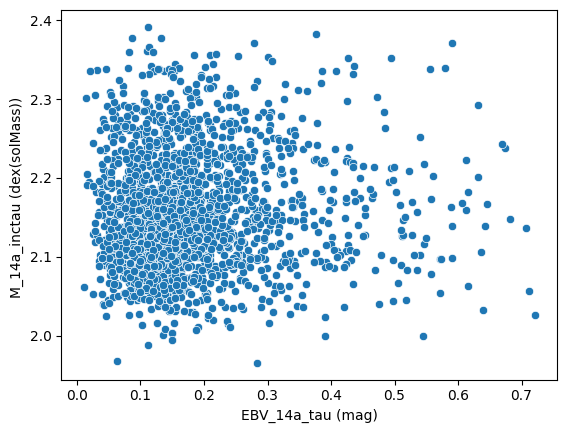

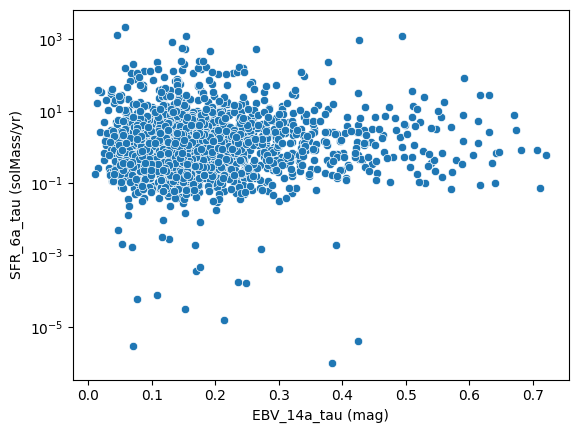

In [20]:
sns.scatterplot(y=np.log(derived_numeric['M_14a_inctau (dex(solMass)) ']), x=observed_numeric['EBV_14a_tau (mag)'])
plt.show()
sns.scatterplot(y=derived_numeric['SFR_6a_tau (solMass/yr)'], x=observed_numeric['EBV_14a_tau (mag)'])
plt.yscale('log')
plt.show()

In [ ]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Define batch size and overlap
batch_size = 5  # Number of columns per batch
overlap = 3     # Number of overlapping columns between batches

# Define the base folder to save the plots
base_folder = "D:/TFG/Plots"

# Ensure directories exist
os.makedirs(f"{base_folder}/kde", exist_ok=True)
os.makedirs(f"{base_folder}/hist", exist_ok=True)

# Function to generate and save pairplots
def save_pairplot(data, subset_cols, dataset_name, batch_start, batch_end, plot_type):
    try:
        out_of_bounds = (data[subset_cols].corr() < -0.3) | (data[subset_cols].corr() > 0.3)

        if out_of_bounds.any().any():
            pairplot = sns.pairplot(data[subset_cols], kind=plot_type)
            pairplot.fig.suptitle(f"Pairplot ({plot_type}) - {dataset_name} - Columns {batch_start} to {batch_end}", y=1.02)
            
            # Define file path
            file_path = f"{base_folder}/{plot_type}/{dataset_name}_batch_{batch_start}-{batch_end}.png"
            pairplot.savefig(file_path)
            plt.close() 
            print(f"Saved {plot_type} pairplot: {file_path}")
        else:
            print(f"Skipping {plot_type} pairplot for {dataset_name}, batch {batch_start}-{batch_end} (correlation matrix is too sparse)")
    
    except Exception as e:
        print(f"Error generating {plot_type} pairplot for {dataset_name}, batch {batch_start}-{batch_end}: {e}")

# Process both datasets
for dataset_name, data in [("observed_numeric", observed_numeric), ("derived_numeric", derived_numeric)]:
    columns = list(data.columns)  # Convert to list for indexing

    # Use a sliding window approach
    for i in range(0, len(columns) - batch_size + 1, batch_size - overlap):
        subset_cols = columns[i:i + batch_size]  # Select batch with overlap
        batch_start = i + 1
        batch_end = i + len(subset_cols)

        # Generate and save KDE pairplot
        save_pairplot(data, subset_cols, dataset_name, batch_start, batch_end, "kde")

        # Generate and save Histogram pairplot
        save_pairplot(data, subset_cols, dataset_name, batch_start, batch_end, "hist")


In [ ]:
sns.pairplot(derived_numeric, kind="kde")
plt.show()


In [ ]:
sns.pairplot(observed_numeric, kind="kde")
plt.show()




In [ ]:
import os
import re
import matplotlib.pyplot as plt

def sanitize_filename(name):
    """More aggressive sanitization"""
    name = str(name).strip()
    name = re.sub(r'[^a-zA-Z0-9_\-.]', '_', name)  # Only allow safe chars
    name = re.sub(r'_+', '_', name)  # Remove duplicate underscores
    return name[:100] 

def create_and_save_plot(directory, filename, max_retries=3):
    """
    Create a simple plot and attempt to save it to the specified directory with the given filename.
    If an error occurs, modify the filename and retry up to 'max_retries' times.
    """
    # Sanitize the initial filename
    base_filename = sanitize_filename(filename)
    full_path = os.path.join(directory, base_filename)
    os.makedirs(directory, exist_ok=True)
    # Create a simple plot
    plt.plot([0, 1, 2], [0, 1, 4])
    plt.title('Test Plot')

    for attempt in range(max_retries):
        try:
            # Attempt to save the plot
            plt.savefig(full_path, dpi=300, bbox_inches='tight')
            plt.close()
            print(f"Plot successfully saved to: {full_path}")
            return
        except OSError as e:
            print(f"Attempt {attempt + 1}: OSError - {e}")
            # Modify the filename by appending a suffix
            new_filename = f"{os.path.splitext(base_filename)[0]}_{attempt + 1}{os.path.splitext(base_filename)[1]}"
            full_path = os.path.join(directory, new_filename)
        except Exception as e:
            print(f"Attempt {attempt + 1}: An unexpected error occurred - {e}")
            # Modify the filename by appending a suffix
            new_filename = f"{os.path.splitext(base_filename)[0]}_{attempt + 1}{os.path.splitext(base_filename)[1]}"
            full_path = os.path.join(directory, new_filename)

    print("Failed to save the plot after multiple attempts.")

# Define the directory and filename
output_directory = 'D:\\TFG\\test3\\Fontana\\2d_plots\\'
output_filename = '2d_Fontana_L2700_6a_deltau_erg_s_Hz_vs_JMag_6a_invtau_mag_.png'

# Run the function
create_and_save_plot(output_directory, output_filename)


Plot successfully saved to: D:\TFG\test3\Fontana\2d_plots\2d_Fontana_L2700_6a_deltau_erg_s_Hz_vs_JMag_6a_invtau_mag_.png


: 

In [19]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import os

# Example DataFrame (replace with your actual dataset)
np.random.seed(42)
df = pd.DataFrame({
    'A': np.random.randn(100),
    'B': np.random.randn(100) * 0.5,
    'C': np.random.randn(100) + 1,
    'D': np.random.randn(100) * 2 - 1,
    'E': np.random.randn(100) * 1.5 + 2,
    'HeatmapVar': np.random.rand(100) * 10  # Numerical variable for heatmap
})

# Set output folder
output_folder = "custom_pairplots"
os.makedirs(output_folder, exist_ok=True)

# Define a custom pairplot function
def custom_pairplot(df, heatmap_column,title=None):
    """Creates a pairplot where all plots (scatter, hist, KDE) use heatmap coloring."""
    # Drop non-numeric columns
    numeric_df = df.select_dtypes(include=[np.number])

    # Normalize the heatmap variable
    norm = plt.Normalize(df[heatmap_column].min(), df[heatmap_column].max())
    cmap = plt.get_cmap("coolwarm")

    def apply_colormap(values):
        """Maps values to colors using the colormap."""
        return cmap(norm(values))

    # Initialize PairGrid
    g = sns.PairGrid(numeric_df, diag_sharey=False)

    # Upper triangle: Scatter plots with heatmap coloring
    def scatter_with_color(x, y, **kwargs):
        colors = apply_colormap(df[heatmap_column])
        plt.scatter(x, y, c=colors, alpha=0.7)

    g.map_upper(scatter_with_color)

    # Lower triangle: Contour KDE plots with heatmap coloring
    def kde_contour_colored(x, y, **kwargs):
        colors = apply_colormap(df[heatmap_column])
        try:
            sns.kdeplot(x=x, y=y, levels=5, fill=True, cmap=colors, alpha=0.7)
        except Exception:
            scatter_with_color(x, y, **kwargs)  # Fallback to scatter plot

    g.map_lower(kde_contour_colored)

    # Diagonal: Histograms with KDE overlay, colored by heatmap variable
    def hist_colored(x, **kwargs):
        colors = apply_colormap(df[heatmap_column])
        sns.histplot(x, kde=True, bins=20, color=colors.mean(axis=0))  # Average color

    g.map_diag(hist_colored)

    # Add a shared color bar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    g.fig.colorbar(sm, ax=g.axes.ravel().tolist(), label=heatmap_column)

    # Save figure
    plot_filename = f"{output_folder}/{title}_pairplot.png"
    plt.savefig(plot_filename, dpi=300)
    plt.close()
    
    print(f"Saved pairplot: {plot_filename}")

# Call the function with the heatmap variable
custom_pairplot(observed_numeric, heatmap_column="z_best ", title="Observed")


Saved pairplot: custom_pairplots/Observed_pairplot.png


In [21]:
custom_pairplot(derived_numeric, heatmap_column="SFR_6a_tau (solMass/yr)", title="Derived")

Saved pairplot: custom_pairplots/Derived_pairplot.png


In [ ]:
sns.pairplot(observed_numeric, diag_kind="hist")
plt.show()

In [ ]:
import os
import logging
import time  
import psutil  
import sys  
import gc  # Import garbage collector
import matplotlib.pyplot as plt  # Ensure this is imported
import warnings
warnings.filterwarnings('ignore')
# Lower priority (Windows)
if sys.platform == "win32":
    p = psutil.Process(os.getpid())
    p.nice(psutil.IDLE_PRIORITY_CLASS)

# Lower priority (Linux/macOS)
elif sys.platform in ["linux", "darwin"]:
    os.nice(10)

# Define directories
dir1 = f'D:/TFG/{author}Gráficas/Observed/2D'
dir2 = f'D:/TFG/{author}Gráficas/Observed/3D'
dir3 = f'D:/TFG/{author}Gráficas/Derived/3D'
dir4 = f'D:/TFG/{author}Gráficas/Derived/2D'

# Configure logging
logging.basicConfig(
    filename="plot_generation.log",
    level=logging.INFO,
    format="%(asctime)s - %(levelname)s - %(message)s",
    datefmt="%Y-%m-%d %H:%M:%S"
)

def ensure_directory_exists(directory):
    """Ensure the given directory exists."""
    try:
        os.makedirs(directory, exist_ok=True)
        logging.info(f"Directory created: {directory}")
    except Exception as e:
        logging.error(f"Failed to create directory {directory}: {e}")

# Ensure observed & derived exist
if 'observed' not in globals() or 'derived' not in globals():
    logging.critical("Error: 'observed' or 'derived' is not defined.")
    raise ValueError("'observed' and 'derived' must be defined before running the script.")

# Ensure directories exist before running
for d in [dir1, dir2, dir3, dir4]:
    ensure_directory_exists(d)

# Start plotting
count = 0
print("Generando gráficas...")



try:
    for i, x in zip(observed_numeric.columns[1:], derived_numeric.columns):
        for j, y in zip(observed_numeric.columns[1:], derived_numeric.columns):
            if i != j:
                try:
                    plot2d(observed, i, j, dir1, count)
                    plt.close('all')  # Close all figures to free memory
                    gc.collect()  # Force garbage collection
                    count += 1
                    logging.info(f"Generated 2D plot {count} for {i} vs {j}")
                    time.sleep(0.5)  # Pause to reduce CPU usage

                    plot2d(derived, x, y, dir4, count)
                    plt.close('all')  
                    gc.collect()  
                    count += 1
                    logging.info(f"Generated 2D plot {count} for {x} vs {y}")
                    time.sleep(0.5)

                except Exception as e:
                    logging.error(f"Error in plot2d({i}, {j}): {e}")
                    continue

            for k, z in zip(observed_numeric.columns[1:], derived_numeric.columns):
                if i != j and i != k and j != k:
                    try:
                        plot3d(observed, i, j, k, dir2, count)
                        plt.close('all')
                        gc.collect()
                        count += 1
                        logging.info(f"Generated 3D plot {count} for {i}, {j}, {k}")
                        time.sleep(1)  # Longer pause for 3D plots

                        plot3d(derived, x, y, z, dir3, count)
                        plt.close('all')
                        gc.collect()
                        count += 1
                        logging.info(f"Generated 3D plot {count} for {x}, {y}, {z}")
                        time.sleep(1)  

                    except Exception as e:
                        logging.error(f"Error in plot3d({i}, {j}, {k}): {e}")
                        continue

except Exception as e:
    logging.critical(f"Unexpected error: {e}")

finally:
    logging.info(f"Total plots generated: {count}")
    print(f"Se generaron {count} gráficas (Ver logs para detalles).")


Generando gráficas...
No se guardó el gráfico debido a la baja correlación.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
No se guardó el gráfico debido a la baja correlación.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no guardada.
Imagen no 

In [ ]:
import logging
import os
import itertools
from typing import List, Tuple


def process_dataframes(dataframes: List[Tuple[pd.DataFrame, str]], 
                      base_output_dir: str = "D:/analysis_results",
                      heatmap_column: str = "target") -> None:
    """
    Process multiple DataFrames to generate visualizations with logging
    
    Args:
        dataframes: List of tuples containing (DataFrame, dataframe_name)
        base_output_dir: Root directory for storing results
        heatmap_column: Column name to use for heatmap coloring in pairplots
    """
    logger = logging.getLogger(__name__)
    
    for df_idx, (df, df_name) in enumerate(dataframes):
        try:
            # Setup directory structure
            df_output_dir = os.path.join(base_output_dir, df_name)
            pairplot_dir = os.path.join(df_output_dir, "pairplots")
            plot2d_dir = os.path.join(df_output_dir, "2d_plots")
            plot3d_dir = os.path.join(df_output_dir, "3d_plots")
            
            os.makedirs(pairplot_dir, exist_ok=True)
            os.makedirs(plot2d_dir, exist_ok=True)
            os.makedirs(plot3d_dir, exist_ok=True)
            
            logger.info(f"Processing DataFrame {df_idx+1}/{len(dataframes)}: {df_name}")
            logger.debug(f"Output directories created in: {df_output_dir}")

            # Generate pairplot
            try:
                logger.info("Generating pairplot...")
                custom_pairplot(df, heatmap_column, pairplot_dir, f"{df_name}_pairplot")
            except Exception as e:
                logger.error(f"Pairplot generation failed: {str(e)}", exc_info=True)

            # Get numeric columns and verify
            numeric_cols = df.select_dtypes(include=np.number).columns.tolist()
            if len(numeric_cols) < 2:
                logger.warning(f"Skipping {df_name} - insufficient numeric columns")
                continue
                
            logger.info(f"Processing {len(numeric_cols)} numeric columns")

            # Generate 2D plots
            logger.info("Starting 2D plot generation...")
            generated_2d = 0
            for (x, y) in itertools.permutations(numeric_cols, 2):
                if x == y:
                    continue
                try:
                    plot2d(df, x, y, plot2d_dir, f"{x}_{y}")
                    generated_2d += 1
                except Exception as e:
                    logger.error(f"2D plot failed for {x}-{y}: {str(e)}", exc_info=True)
            logger.info(f"Generated {generated_2d} 2D plots")

            # Generate 3D plots
            logger.info("Starting 3D plot generation...")
            generated_3d = 0
            for triplet in itertools.combinations(numeric_cols, 3):
                x, y, z = triplet
                try:
                    plot3d(df, x, y, z, plot3d_dir, "_".join(triplet))
                    generated_3d += 1
                except Exception as e:
                    logger.error(f"3D plot failed for {triplet}: {str(e)}", exc_info=True)
            logger.info(f"Generated {generated_3d} 3D plots")

        except Exception as e:
            logger.error(f"Critical error processing {df_name}: {str(e)}", exc_info=True)
            continue

    logger.info("DataFrame processing completed")

# Example usage
if __name__ == "__main__":
    # Configure logging
    logging.basicConfig(
        level=logging.INFO,
        format="%(asctime)s [%(levelname)s] %(message)s",
        handlers=[
            logging.FileHandler("data_processing.log"),
            logging.StreamHandler()
        ]
    )
    
    # Prepare sample data
    df1 = pd.DataFrame(np.random.rand(100, 5), columns=list("ABCDE"))
    df1["target"] = np.random.randint(0, 2, 100)
    
    df2 = pd.DataFrame(np.random.randn(150, 6), columns=list("FGHIJK"))
    df2["target"] = np.random.normal(0, 1, 150)
    
    # List of (DataFrame, name) tuples
    dataframes = [
        (df1, "dataset_1"),
        (df2, "dataset_2")
    ]
    
    # Process all DataFrames
    process_dataframes(
        dataframes=dataframes,
        base_output_dir="D:/data_analysis",
        heatmap_column="target"
    )

In [ ]:
fontana = df_cleaned.filter(regex = r'(mag)|(erg)|^z_best|^zbestM|^RAdeg|^DECdeg$', axis=1)
fontana.head()
# A continuación reducimos los datos a 2,000 para poder visualizarlos mejor mezclandolos por si acaso .


# Assuming df is your DataFrame
df_shuffled = fontana.sample(frac=1).reset_index(drop=True)

# Select the first 2000 rows
df_sampled = df_shuffled[:2000]

# Display the sampled DataFrame
df_sampled.head(2001)


In [ ]:
import numpy as np
print(fontana.columns)
fontana.replace(-99.0, np.nan, inplace=True)
df_sampled.replace(-99.0, np.nan, inplace=True)
df_sampled.shape

In [ ]:
# Vamos a ver como varía la luminosidad con el redshift 
import plotly.express as px
import seaborn as sns
import numpy as np
y=np.log10(df_sampled['L1400_6a_tau (erg/s/Hz)']/3.839e33)
fig = px.scatter(df_sampled,
                     x="z_best ", y=y, color="z_best_type ", log_y=True,
                      size_max=60,
                     template="ggplot2")
fig.show()


In [ ]:
numerical_variable = 'z_best '  # Replace with your actual column name

# Create bins for ranges (e.g., from min to max of the variable with 0.5 intervals)
bins = np.arange(df_sampled[numerical_variable].min(), df_sampled[numerical_variable].max() + 0.2, 0.2)

# Cut the variable into discrete intervals
df_sampled['ranges'] = pd.cut(df_sampled[numerical_variable], bins)

# Create a dictionary to hold DataFrames for each range
dataframes_per_range = {str(interval): group for interval, group in df_sampled.groupby('ranges')}

print(dataframes_per_range)

In [ ]:
import plotly.express as px
for i in df_sampled.columns[33:37]: # 7, 8, 9, 21, 23, 24 dpendencia lineal mínima
    #g = sns.JointGrid(data=fontana, x="z_best ", y=i)
    title = f"Fontana {i} vs redshift"
   

    fig = px.scatter(df_sampled,
                     x="z_best ", y=i, color="ranges", log_y=True,
                      size_max=60,
                     template="ggplot2", title=title)
    fig.show() 

# Creamos unos repots en HTML para explorar los datos

#import pandas as pd

from tqdm._tqdm import tqdm 
from ydata_profiling import ProfileReport
from IPython.display import display

# Create a DataFrame


# Generate the profile report
#profile1 = ProfileReport(cosmic_noon_phys_prop, title="Physical properties of the galaxies in COSMIC Noon")
#
#profile1.to_file("cosmic_noon_phys_prop_report.html")


# Embed HTML file using IFrame
file_path = 'cosmic_noon_mass_prop_report.html'  
from IPython.core.display import HTML


with open(file_path, 'r') as f:
    html_content = f.read()

display(HTML(html_content))


In [ ]:
#profile2 = ProfileReport(cosmic_noon_phot, title="Redshift of the galaxies in COSMIC Noon")
#profile2.to_file("cosmic_noon_phot_prop_report.html") 


In [ ]:
#profile3 = ProfileReport(cosmic_noon_mass, title="Mass of the galaxies in COSMIC Noon")
#profile3.to_file("cosmic_noon_mass_prop_report.html")

In [ ]:
#profile4 = ProfileReport(fontana, title="COSMIC Noon data from Fontana")
#profile4.to_file("cosmic_noon_fontana_report.html")

#hue = cosmic_noon_mass[["",""]]
mas_cols=[i for i in mass_data.columns[21:35]]

g = sns.PairGrid(cosmic_noon_mass[mas_cols]) 
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot, hue=cosmic_noon_mass["AGNflag        "])
g.add_legend(title="", adjust_subtitles=True)

In [ ]:
""" def translate_column_name(column_name):
    # Dictionaries for mapping codes and SFH types
    pi_codes = {
        '2a': 'Barro',
        '6a': 'Fontana',
        '10a': 'Pforr',
        '11a': 'Salvato',
        '12a': 'Wiklind',
        '13a': 'Wuyts',
        '14a': 'BooMe Lee',
        '15a': 'Lee',
    }
    
    sfh_types = {
        'cons': 'constant',
        'tau': 'exponentially declining',
        'deltau': 'delayed-exponential',
        'lin': 'linearly increasing',
        'inctau': 'exponentially increasing',
    }
    
    # Split the input string to isolate the relevant part
    relevant_part = column_name.split(' ')[0]
    
    try:
        # Split the relevant part into components
        _, pi_code, sfh_code = relevant_part.split('_')
        
        # Translate using the dictionaries
        pi_translation = pi_codes.get(pi_code, 'Unknown PI code')
        sfh_translation = sfh_types.get(sfh_code, 'Unknown SFH type')
        
        # Create a dictionary for the output
        
        return {
            "PI": pi_translation,
            "SFH": sfh_translation
        }
    except ValueError:
        return {"error": "Invalid column name format"}

# Example usage
column_name = "M_2a_tau   (dex(solMass)))"
translated = translate_column_name(column_name)
print(translated)  # Output: {'PI': 'Barro', 'SFH': 'exponentially declining'} """


In [ ]:
# Mostrar estadísticas descriptivas para las columnas 21 a 34 (Python usa índices de 0)
""" mass_data_subset = mass_data.iloc[:, 21:35]
filtered_data = mass_data_subset[(mass_data_subset > 0).all(axis=1)]
filtered_data[:5]
 """

In [ ]:
""" for i in mass_data.columns[21:35]:
    g = sns.JointGrid(data=cosmic_noon_mass[cosmic_noon_mass[i]>0], x="zbest          ", y=i)
    trans = translate_column_name(i)
    title = f"Mass vs redshift from {trans['PI']} using {trans['SFH']}"
    g.plot(sns.regplot, sns.histplot)
    plt.suptitle(title, y = 1) """


In [ ]:
y=np.log10(fontana['L2700_6a_tau (erg/s/Hz)']/3.839e33)

sns.residplot(data=fontana,x='z_best ', y=y)

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import dcor
def plot_cor_matrix(corr, mask=None):
    f, ax = plt.subplots(figsize=(20, 20))
    sns.heatmap(corr, ax=ax,
                mask=mask,
                # cosmetics
                annot=True, vmin=-1, vmax=1, center=0,
                cmap='coolwarm', linewidths=0.5, linecolor='black', cbar_kws={'orientation': 'horizontal'})
def corr_sig(df=None):
    p_matrix = np.zeros(shape=(df.shape[1],df.shape[1]))
    for col in df.columns:
        for col2 in df.drop(col,axis=1).columns:
            p = dcor.distance_correlation(df[col].astype(float),df[col2].astype(float))
            _,p_pearson = stats.pearsonr(df[col].astype(float),df[col2].astype(float))
            p_matrix[df.columns.to_list().index(col),df.columns.to_list().index(col2)] = p
    return p_matrix

In [10]:
corr = fontana.drop(['z_best_type ', 'ID'], axis=1).corr()                            # get correlation
p_values = corr_sig(fontana.drop(['z_best_type ', 'ID'], axis=1))                     # get p-Value
mask = np.invert(np.tril(p_values>0.5))    # mask - only get significant corr
plot_cor_matrix(observed_numeric.corr(),mask) 

NameError: name 'fontana' is not defined

In [ ]:
# Selecciona las columnas con correlación alta
high_corr_columns = correlation_matrix.columns[(correlation_matrix > 0.9).any() | (correlation_matrix < -0.9).any()]
filtered_df = filtered_data[high_corr_columns]

# Grafica el pairplot solo para las columnas seleccionadas
sns.pairplot(filtered_df)
plt.suptitle("Pairplot Filtrado (Solo Correlaciones Significativas)", y=1.02)
plt.show()


# Dendograma de la masa de los diferentes autores

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage

# Calcula las distancias y el linkage para el dendrograma
linked = linkage(fontana.T, method='ward', optimal_ordering=True)  # 'ward' es común, pero se pueden probar otros métodos

# Grafica el dendrograma
plt.figure(figsize=(10, 6))
dendrogram(linked, labels=filtered_data.columns, orientation='top', leaf_rotation=90)
plt.title("Dendrograma de Similitud entre la masa de los autores")
plt.show()


# PCA

In [ ]:
from sklearn.decomposition import PCA
import numpy as np

# Normaliza los datos (opcional pero recomendado para PCA)
data_excluded = fontana.loc[:, fontana.columns != 'z_best_type ']
df_normalized = (data_excluded - data_excluded.mean()) / data_excluded.std()

# Aplica PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(df_normalized.T)  # Transpuesta para comparar columnas en lugar de filas

# Grafica los resultados de PCA
plt.figure(figsize=(8, 6))
plt.scatter(pca_result[:, 0], pca_result[:, 1])

# Añade etiquetas a cada punto
for i, column in enumerate(data_excluded.columns):
    plt.text(pca_result[i, 0], pca_result[i, 1], column)

plt.title("Análisis de Componentes Principales (PCA) de Columnas")
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.show()


In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Definir funciones para el ajuste de curvas
def linear(x, a, b):
    return a * x + b

def quadratic(x, a, b, c):
    return a * x**2 + b * x + c

def exponential(x, a, b):
    return a * np.exp(b * x)

# Seleccionar dos columnas para comparar (por ejemplo, 'col1' y 'col2')
for i in range(len(filtered_data.columns)-1):
    p = filtered_data.columns[i]
    s = filtered_data.columns[i+1]
    x = filtered_data[p]
    y = filtered_data[s]

    # Gráfico de dispersión
    plt.scatter(x, y, label="Datos")

    # Ajuste de curva lineal
    params, _ = curve_fit(linear, x, y)
    plt.plot(x, linear(x, *params), label="Lineal", color='red')

    # Ajuste de curva cuadrática
    params, _ = curve_fit(quadratic, x, y)
    plt.plot(x, quadratic(x, *params), label="Cuadrática", color='green')

    # Ajuste de curva exponencial
    params, _ = curve_fit(exponential, x, y)
    plt.plot(x, exponential(x, *params), label="Exponencial", color='blue')

    # Personalización del gráfico
    plt.legend()
    plt.xlabel(filtered_data.columns[i])
    plt.ylabel(filtered_data.columns[i+1])
    plt.title("Ajuste de Curvas: Lineal, Cuadrática y Exponencial")
    plt.show()


In [ ]:
for i in range(len(filtered_data.columns)-1):
    p = filtered_data.columns[i]
    s = filtered_data.columns[i+1]
    x = filtered_data[p]
    y = filtered_data[s]

# Correlación de Spearman
    spearman_corr = x.corr(y, method='spearman')
    print(f"Correlación de Spearman de {p} con {x}: {spearman_corr}")

    # Correlación de Kendall
    kendall_corr = x.corr(y, method='kendall')
    print(f"Correlación de Kendall de {p} con {x}: {kendall_corr}")


In [ ]:
from sklearn.metrics import r2_score

# Ajuste lineal
for i in range(len(filtered_data.columns)-1):
    p = filtered_data.columns[i]
    s = filtered_data.columns[i+1]
    x = filtered_data[p]
    y = filtered_data[s]
    params, _ = curve_fit(linear, x, y)
    y_pred_linear = linear(x, *params)
    r2_linear = r2_score(y, y_pred_linear)

    # Ajuste cuadrático
    params, _ = curve_fit(quadratic, x, y)
    y_pred_quadratic = quadratic(x, *params)
    r2_quadratic = r2_score(y, y_pred_quadratic)

    # Ajuste exponencial
    params, _ = curve_fit(exponential, x, y)
    y_pred_exponential = exponential(x, *params)
    r2_exponential = r2_score(y, y_pred_exponential)
    print(f"{p} vs {s}:")
    if r2_linear >0.9 or r2_quadratic >0.9 or r2_exponential >0.9:
        print("R² Lineal:", r2_linear)
        print("R² Cuadrática:", r2_quadratic)
        print("R² Exponencial:", r2_exponential)
    else:
        print("R² muy bajo")


In [ ]:

for i in range(len(filtered_data.columns)-1):
    p = filtered_data.columns[i]
    s = filtered_data.columns[i+1]
    
# Regresión lineal (order=1)
    sns.regplot(x=p, y=s, data=filtered_data, order=1, line_kws={"color": "red"}, label="Lineal")

    # Regresión cuadrática (order=2)
    sns.regplot(x=p, y=s, data=filtered_data, order=2, line_kws={"color": "green"}, label="Cuadrática")

    # Regresión cúbica (order=3)
    sns.regplot(x=p, y=s, data=filtered_data, order=3, line_kws={"color": "blue"}, label="Cúbica")

    plt.legend()
    plt.title("Ajuste de Regresiones de Diferentes Órdenes")
    plt.show()


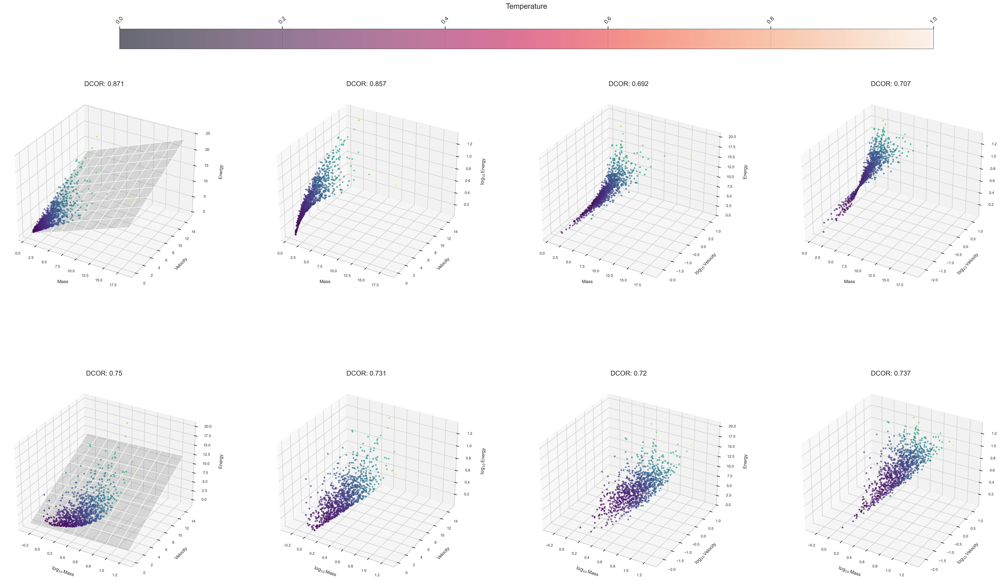

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import itertools

# Generate synthetic positive-definite data
np.random.seed(42)
n_samples = 1000

# Create three positively correlated variables with different distributions
X = np.exp(np.random.normal(1, 0.5, n_samples))  # Log-normal distribution
Y = np.random.exponential(2, n_samples)          # Exponential distribution
Z = X +Y   # Normal distribution shifted to positive values
heatmap_data = X + Y + Z                         # Create a fourth variable for coloring

# Create DataFrame
df = pd.DataFrame({
    'Mass': X,
    'Velocity': Y,
    'Energy': Z,
    'Temperature': heatmap_data  # Used for color mapping
})

# Parameters for the visualization
x = 'Mass'
y = 'Velocity'
z = 'Energy'
heatmap_column = 'Temperature'

# Visualization code with improved spacing
fig = plt.figure(figsize=(35, 20), dpi=300)  # Increased figure width

# Data preparation
scope = df[[x, y, z]].apply(pd.to_numeric, errors='coerce').astype(np.float32)
data_variants = []
labels = []

# Generate axis combinations
# Modified axis combination generation
if np.any(scope.values <= 0):
    # Identify which columns can be logarithmically transformed
    eligible_axes = [np.all(scope[col] > 0) for col in [x, y, z]]
    
    # Generate possible transformations only for eligible columns
    axis_options = []
    for col, can_log in zip([x, y, z], eligible_axes):
        axis_options.append([False, True] if can_log else [False])
    
    axis_combinations = list(itertools.product(*axis_options))
    
    data_variants = []
    labels = []
    for log_x, log_y, log_z in axis_combinations:
        temp_data = scope.copy()
        x_label = r"$\log_{10}$" + x if log_x else x
        y_label = r"$\log_{10}$" + y if log_y else y
        z_label = r"$\log_{10}$" + z if log_z else z
        
        if log_x: temp_data[x] = np.log10(temp_data[x])
        if log_y: temp_data[y] = np.log10(temp_data[y])
        if log_z: temp_data[z] = np.log10(temp_data[z])
        
        data_variants.append(temp_data)
        labels.append((x_label, y_label, z_label))
else:
    # Original code for all-positive case
    axis_combinations = list(itertools.product([False, True], repeat=3))
    data_variants = []
    labels = []
    for log_x, log_y, log_z in axis_combinations:
        temp_data = scope.copy()
        x_label = r"$\log_{10}$" + x if log_x else x
        y_label = r"$\log_{10}$" + y if log_y else y
        z_label = r"$\log_{10}$" + z if log_z else z
        
        if log_x: temp_data[x] = np.log10(temp_data[x])
        if log_y: temp_data[y] = np.log10(temp_data[y])
        if log_z: temp_data[z] = np.log10(temp_data[z])
        
        data_variants.append(temp_data)
        labels.append((x_label, y_label, z_label))

# Create subplot grid with adjusted spacing
n_plots = len(data_variants)
n_cols = min(n_plots, 4)
n_rows = (n_plots + n_cols - 1) // n_cols

# Create subplots with increased spacing
axes = []
for i in range(n_plots):
    axes.append(fig.add_subplot(n_rows, n_cols, i+1, projection='3d'))

# Adjust subplot parameters
plt.subplots_adjust(left=0.05,  # Reduced left margin
                    right=0.9,  # Increased right margin for colorbar
                    bottom=0.1,
                    top=0.9,
                    wspace=0.3,  # Increased horizontal space between subplots
                    hspace=0.2)  # Increased vertical space between subplots

 #Color setup
if heatmap_column and heatmap_column in df:
    cmap = plt.get_cmap("viridis")
    norm = plt.Normalize(df[heatmap_column].min(), df[heatmap_column].max())
    colors = cmap(norm(df[heatmap_column]))
else:
    colors = 'red'

# Plot each combination with adjusted label padding
pca_results = []
for ax, (data, (xl, yl, zl)) in zip(axes, zip(data_variants, labels)):
    # PCA analysis
    scaler = StandardScaler()
    points = scaler.fit_transform(data)
    pca = PCA(n_components=3).fit(points)
    pca_results.append(pca.explained_variance_ratio_[2])
    
    # Plot data with adjusted label positions
    scatter = ax.scatter(data[x], data[y], data[z], c=colors, s=8, alpha=0.6)
    ax.set_xlabel(xl, fontsize=10, labelpad=15)  # Increased labelpad
    ax.set_ylabel(yl, fontsize=10, labelpad=15)  # Increased labelpad
    ax.set_zlabel(zl, fontsize=10, labelpad=15)  # Increased labelpad
    ax.tick_params(axis='both', which='major', labelsize=8, pad=8)  # Increased tick padding
    ax.set_title(f'DCOR: {round(distance_correlation(data[[x,y]],data[z]),3)}')
    
    # Add PCA plane if needed
    if pca.explained_variance_ratio_[2] <= 1e-2:
        xx, yy = np.meshgrid(
            np.linspace(data[x].min(), data[x].max(), 10),
            np.linspace(data[y].min(), data[y].max(), 10)
        )
        zz = (-pca.components_[2][0] * xx -
              pca.components_[2][1] * yy -
              pca.mean_ @ pca.components_[2]) / pca.components_[2][2]
        ax.plot_surface(xx, yy, zz, alpha=0.25, color='gray')


# Add colorbar in dedicated space
if heatmap_column and heatmap_column in df:
    # Create axis for horizontal colorbar (left, bottom, width, height)
    cbar_ax = fig.add_axes([0.15, 0.93, 0.7, 0.03])  # Centered horizontal bar
    
    # Create horizontal colorbar
    cbar = fig.colorbar(scatter, cax=cbar_ax, orientation='horizontal')
    cbar.set_label('Temperature', fontsize=16, labelpad=15)
    
    # Style adjustments
    cbar.ax.tick_params(labelsize=12, rotation=45)
    cbar_ax.xaxis.set_ticks_position('top')
    cbar_ax.xaxis.set_label_position('top')
    
    # Add outline for better visibility
    cbar.outline.set_edgecolor('black')
    cbar.outline.set_linewidth(0.5)

#plt.tight_layout(pad=3.0)  # Added padding around tight layout
plt.show()

In [ ]:
def plot2d(df, x, y, dire, n, heatmap_column, dataset_dir):
    """Generate 2D plots with all valid log/linear combinations."""
    try:
        logger.info(f"Creating 2D plot {n} for {x} vs {y}")
        
        # Check for valid logarithmic transformation candidates
        x_positive = not np.any(df[x] <= 0)
        y_positive = not np.any(df[y] <= 0)
        
        # Generate valid axis combinations
        axis_options = {
            'x': [False, True] if x_positive else [False],
            'y': [False, True] if y_positive else [False]
        }
        combinations = list(itertools.product(axis_options['x'], axis_options['y']))
        
        # Calculate correlations for all combinations
        correlations = {}
        for log_x, log_y in combinations:
            x_data = np.log10(df[x]) if log_x else df[x]
            y_data = np.log10(df[y]) if log_y else df[y]
            correlations[(log_x, log_y)] = distance_correlation(x_data, y_data)

        # Check if any correlation meets the threshold
        if max(correlations.values()) <= 0.7:
            logger.info(f"Skipping 2D plot {n} - all correlation coefficients are too low")
            return

        # Setup figure and axes
        safe_n = sanitize_filename(n)
        safe_x = sanitize_filename(x)
        safe_y = sanitize_filename(y)
        os.makedirs(dire, exist_ok=True)
        
        if safe_n in completed_plots:
            logger.info(f"Skipping plot {n}: already completed.")
            return

        # Create dynamic subplot grid
        n_plots = len(combinations)
        n_cols = min(n_plots, 2)
        n_rows = (n_plots + n_cols - 1) // n_cols
        
        sns.set_theme(style="whitegrid", font_scale=1.2)
        fig = plt.figure(figsize=(8 * n_cols, 6 * n_rows), dpi=300)
        plt.suptitle(f"{safe_x} vs {safe_y}", y=0.94, fontsize=16)
        
        # Adjust spacing for colorbar
        plt.subplots_adjust(
            left=0.1/n_cols,
            right=0.9,
            bottom=0.1,
            top=0.85,
            wspace=0.3,
            hspace=0.4
        )

        # Heatmap setup
        cmap = plt.get_cmap("viridis")
        norm = None
        if heatmap_column and heatmap_column in df:
            norm = plt.Normalize(df[heatmap_column].min(), df[heatmap_column].max())
            sm = ScalarMappable(norm=norm, cmap=cmap)
            sm.set_array([])

        # Plot each combination
        for idx, (log_x, log_y) in enumerate(combinations, 1):
            ax = fig.add_subplot(n_rows, n_cols, idx)
            
            # Transform data
            x_data = np.log10(df[x]) if log_x else df[x]
            y_data = np.log10(df[y]) if log_y else df[y]
            
            # Create labels
            x_label = f"log10({safe_x})" if log_x else safe_x
            y_label = f"log10({safe_y})" if log_y else safe_y
            
            # Plot points
            scatter = ax.scatter(
                x_data, y_data,
                c=df[heatmap_column] if heatmap_column else 'red',
                cmap=cmap, norm=norm,
                s=30, alpha=0.7
            )
            
            # Format labels
            ax.set_xlabel(x_label, fontsize=12)
            ax.set_ylabel(y_label, fontsize=12)
            ax.set_title(f"DCOR: {correlations[(log_x, log_y)]:.2f}", fontsize=12)
            
            # Add grid
            ax.grid(True, alpha=0.3)

        # Add colorbar if using heatmap
        if heatmap_column and norm:
            cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
            cbar = fig.colorbar(scatter, cax=cbar_ax)
            cbar.set_label(heatmap_column, fontsize=12, labelpad=15)
            cbar.ax.tick_params(labelsize=10)

        # Save plot
        filename = pathlib.Path(os.path.join(dire, f"2d_{safe_n}.png"))
        if len(str(filename)) > 100:
            logger.warning(f"Filename {filename} is too long, using hash instead")
            hash_id = hashlib.md5(safe_n.encode()).hexdigest()[:6]
            filename = pathlib.Path(os.path.join(dire, f"2d_{hash_id}.png"))
            
        plt.savefig(filename, bbox_inches="tight")
        logger.info(f"Saved 2D plot to {filename}")
        save_completed_plot(safe_n)

    except Exception as e:
        try:
            logging.error(f"Error in plot3d: {e}", exc_info=True)
        except Exception as log_err:
            print(f"Failed to log error: {log_err}")  # Fallback logging
        
        try:
            e_path = pathlib.Path(os.path.normpath(os.path.join(dataset_dir, "errors")))
            os.makedirs(e_path, exist_ok=True)
            hash_id = hashlib.md5(safe_n.encode()).hexdigest()[:6]
            filename = pathlib.Path(os.path.normpath(os.path.join(e_path, f"2d_{hash_id}.png")))
            plt.savefig(filename, bbox_inches="tight")
            logger.info(f"Saved 2D plot to {filename}")
            save_completed_plot(safe_n)
        except Exception as e:
            logger.error(f"Error in 2D plot {n}: {e}", exc_info=True)
    finally:
        plt.close('all')

c:\Users\alvar\Desktop\UCM\Cuarto Curso\TFG\.venv\Lib\site-packages\dcor\_fast_dcov_avl.py:554: UserWarning: Falling back to uncompiled AVL fast distance covariance terms because of TypeError exception raised: No matching definition for argument type(s) array(float32, 1d, C), array(float32, 1d, C), bool. Rembember: only floating point values can be used in the compiled implementations.
  warnings.warn(


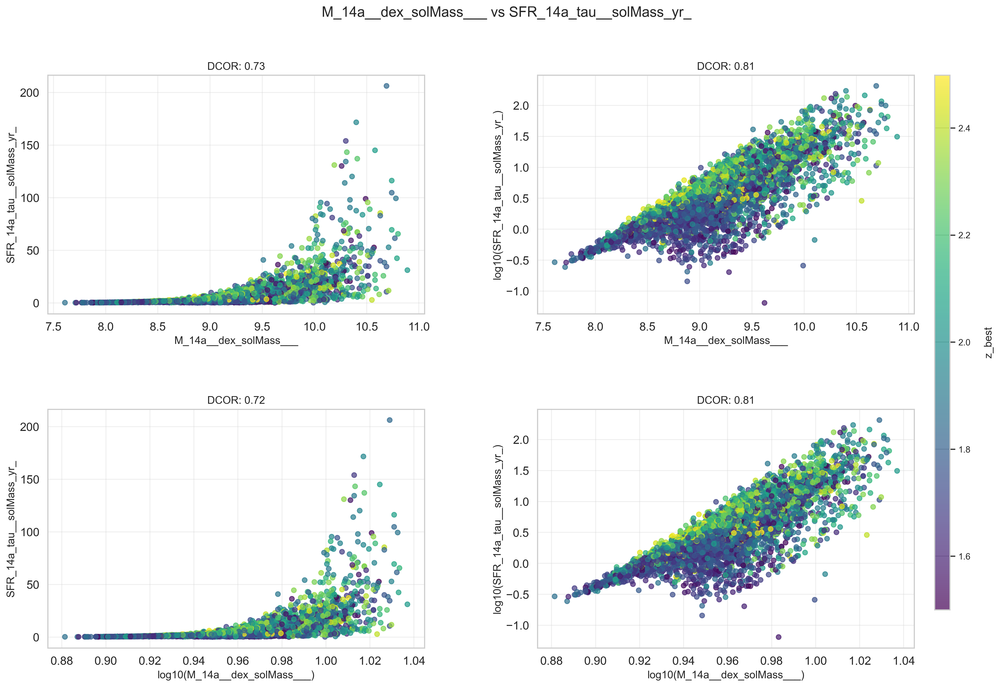

In [26]:
from dcor import distance_correlation
import seaborn as sns
from matplotlib.cm import ScalarMappable
import itertools


n="SFR vs Mass"
x='M_14a (dex(solMass)) '
y='SFR_14a_tau (solMass/yr)'
heatmap_column='z_best'

df= df_numeric

def sanitize_filename(name):
    """Basic filename sanitizer."""
    return "".join(c if c.isalnum() else "_" for c in name)
# Setup figure and axes
safe_n = sanitize_filename(n)
safe_x = sanitize_filename(x)
safe_y = sanitize_filename(y)

# Check for valid logarithmic transformation candidates
x_positive = not np.any(df[x] <= 0)
y_positive = not np.any(df[y] <= 0)

# Generate valid axis combinations
axis_options = {
    'x': [False, True] if x_positive else [False],
    'y': [False, True] if y_positive else [False]
}
combinations = list(itertools.product(axis_options['x'], axis_options['y']))

# Calculate correlations for all combinations
correlations = {}
for log_x, log_y in combinations:
    x_data = np.log10(df[x]) if log_x else df[x]
    y_data = np.log10(df[y]) if log_y else df[y]
    correlations[(log_x, log_y)] = distance_correlation(x_data, y_data)
# Create dynamic subplot grid
n_plots = len(combinations)
n_cols = min(n_plots, 2)
n_rows = (n_plots + n_cols - 1) // n_cols

sns.set_theme(style="whitegrid", font_scale=1.2)
fig = plt.figure(figsize=(8 * n_cols, 6 * n_rows), dpi=300)
plt.suptitle(f"{safe_x} vs {safe_y}", y=0.94, fontsize=16)

# Adjust spacing for colorbar
plt.subplots_adjust(
    left=0.1/n_cols,
    right=0.9,
    bottom=0.1,
    top=0.85,
    wspace=0.3,
    hspace=0.4
)

# Heatmap setup
cmap = plt.get_cmap("viridis")
norm = None
if heatmap_column and heatmap_column in df:
    norm = plt.Normalize(df[heatmap_column].min(), df[heatmap_column].max())
    sm = ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])

# Plot each combination
for idx, (log_x, log_y) in enumerate(combinations, 1):
    ax = fig.add_subplot(n_rows, n_cols, idx)
    
    # Transform data
    x_data = np.log10(df[x]) if log_x else df[x]
    y_data = np.log10(df[y]) if log_y else df[y]
    
    # Create labels
    x_label = f"log10({safe_x})" if log_x else safe_x
    y_label = f"log10({safe_y})" if log_y else safe_y
    
    # Plot points
    scatter = ax.scatter(
        x_data, y_data,
        c=df[heatmap_column] if heatmap_column else 'red',
        cmap=cmap, norm=norm,
        s=30, alpha=0.7
    )
    
    # Format labels
    ax.set_xlabel(x_label, fontsize=12)
    ax.set_ylabel(y_label, fontsize=12)
    ax.set_title(f"DCOR: {correlations[(log_x, log_y)]:.2f}", fontsize=12)
    
    # Add grid
    ax.grid(True, alpha=0.3)

# Add colorbar if using heatmap
if heatmap_column and norm:
    cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
    cbar = fig.colorbar(scatter, cax=cbar_ax)
    cbar.set_label(heatmap_column, fontsize=12, labelpad=15)
    cbar.ax.tick_params(labelsize=10)
plt.show()

In [24]:
# Sample data
physical_properties = 'Data/raw/hlsp_candels_hst_wfc3_egs_multi_v1_physpar-cat.txt'

phys_prop_data = pd.read_csv(physical_properties, sep='\s+', header=None, skiprows=123)



#A continuación añadimos las columnas

phys_prop_data.columns = ["ID",
"age_2a_tau (dex(yr))" ,
"tau_2a_tau (Gyr)" ,
"Av_2a_tau (mag)" ,
"SFR_2a_tau (solMass/yr)" ,
"chi2_2a_tau ",
"age_4b (dex(yr))" ,
"EBV_4b (mag)" ,
"age_6a_tau (dex(yr))" ,
"tau_6a_tau (Gyr)" ,
"EBV_6a_tau (mag)" ,
"SFR_6a_tau (solMass/yr)" ,
"met_6a_tau (solMet)" ,
"extlw_6a_tau ",
"chi2_6a_tau ",
"L1400_6a_tau (erg/s/Hz)" ,
"L2700_6a_tau (erg/s/Hz)" ,
"UMag_6a_tau (mag)" ,
"BMag_6a_tau (mag)" ,
"VMag_6a_tau (mag)" ,
"RMag_6a_tau (mag)" ,
"IMag_6a_tau (mag)" ,
"JMag_6a_tau (mag)" ,
"KMag_6a_tau (mag)" ,
"age_10c (dex(yr))" ,
"SFH_10c ",
"tau_10c (Gyr)" ,
"met_10c (solMet)" ,
"M_l99_11a_tau (dex(solMass))",
"M_u99_11a_tau (dex(solMass))",
"age_11a_tau (dex(yr))" ,
"SFR_11a_tau (solMass/yr)" ,
"M_l68_12a (dex(solMass))",
"M_u68_12a (dex(solMass))",
"M_l95_12a (dex(solMass))",
"M_u95_12a (dex(solMass))",
"age_12a (dex(yr))" ,
"tau_12a (Gyr)" ,
"EBV_12a (mag)" ,
"met_12a (solMet)" ,
"Lbol_12a (dex(solLum))" ,
"chi2_12a ",
"age_13a_tau (dex(yr))" ,
"tau_13a_tau (Gyr)" ,
"Av_13a_tau (mag)" ,
"SFR_13a_tau (solMass/yr)" ,
"chi2_13a_tau ",
"age_14a (dex(yr))" ,
"SFH_14a ",
"tau_14a (Gyr)" ,
"EBV_14a (mag)" ,
"SFR_14a (solMass/yr)" ,
"q_14a ",
"age_6a_tau ^NEB (dex(yr))" ,
"tau_6a_tau ^NEB (Gyr)" ,
"EBV_6a_tau ^NEB (mag)" ,
"SFR_6a_tau ^NEB (solMass/yr)" ,
"met_6a_tau ^NEB (solMet)" ,
"extlw_6a_tau ^NEB ",
"chi2_6a_tau ^NEB ",
"L1400_6a_tau ^NEB (erg/s/Hz)" ,
"L2700_6a_tau ^NEB (erg/s/Hz)" ,
"UMag_6a_tau ^NEB (mag)" ,
"BMag_6a_tau ^NEB (mag)" ,
"VMag_6a_tau ^NEB (mag)" ,
"RMag_6a_tau ^NEB (mag)" ,
"IMag_6a_tau ^NEB (mag)" ,
"JMag_6a_tau ^NEB (mag)" ,
"KMag_6a_tau ^NEB (mag)" ,
"age_6a_deltau (dex(yr))" ,
"tau_6a_deltau (Gyr)" ,
"EBV_6a_deltau (mag)" ,
"SFR_6a_deltau (solMass/yr)" ,
"met_6a_deltau (solMet)" ,
"extlw_6a_deltau ",
"chi2_6a_deltau ",
"L1400_6a_deltau (erg/s/Hz)" ,
"L2700_6a_deltau (erg/s/Hz)" ,
"UMag_6a_deltau (mag)" ,
"BMag_6a_deltau (mag)" ,
"VMag_6a_deltau (mag)" ,
"RMag_6a_deltau (mag)" ,
"IMag_6a_deltau (mag)" ,
"JMag_6a_deltau (mag)" ,
"KMag_6a_deltau (mag)" ,
"age_6a_invtau (dex(yr))" ,
"tau_6a_invtau (Gyr)" ,
"EBV_6a_invtau (mag)" ,
"SFR_6a_invtau (solMass/yr)" ,
"met_6a_invtau (solMet)" ,
"extlw_6a_invtau ",
"chi2_6a_invtau ",
"L1400_6a_invtau (erg/s/Hz)" ,
"L2700_6a_invtau (erg/s/Hz)" ,
"UMag_6a_invtau (mag)" ,
"BMag_6a_invtau (mag)" ,
"VMag_6a_invtau (mag)" ,
"RMag_6a_invtau (mag)" ,
"IMag_6a_invtau (mag)" ,
"JMag_6a_invtau (mag)" ,
"KMag_6a_invtau (mag)" ,
"age_10c ^dust (dex(yr))" ,
"SFH_10c ^dust ",
"tau_10c ^dust (Gyr)" ,
"met_10c ^dust (solMet)" ,
"age_14a_const (dex(yr))" ,
"EBV_14a_const (mag)" ,
"SFR_14a_const (solMass/yr)" ,
"q_14a_const ",
"age_14a_lin (dex(yr))" ,
"EBV_14a_lin (mag)" ,
"SFR_14a_lin (solMass/yr)" ,
"q_14a_lin ",
"age_14a_deltau (dex(yr))" ,
"tau_14a_deltau (Gyr)" ,
"EBV_14a_deltau (mag)" ,
"SFR_14a_deltau (solMass/yr)" ,
"q_14a_deltau ",
"age_14a_tau (dex(yr))" ,
"tau_14a_tau (Gyr)" ,
"EBV_14a_tau (mag)" ,
"SFR_14a_tau (solMass/yr)" ,
"q_14a_tau "]



mass = 'Data/raw/hlsp_candels_hst_wfc3_egs_multi_v1_mass-cat.txt'

mass_data = pd.read_csv(mass, sep='\s+', header=None, skiprows=39)


#A continuación añadimos las columnas

mass_data.columns = ["ID"
,"RAdeg (deg) "
,"DECdeg (deg) "
,"Hmag (mag) "
,"PhotFlag "
,"Class_star "
,"AGNflag "
,"zphot "
,"zspec "
,"q_zspec "
,"r_zspec "
,"zbestM "
,"zphot_l68 "
,"zphot_u68 "
,"zphot_l95 "
,"zphot_u95 "
,"zAGN "
,"M_neb_med (dex(solMass)) "
,"s_neb_med (dex(solMass)) "
,"M_med (dex(solMass)) "
,"s_med (dex(solMass)) "
,"M_14a_cons (dex(solMass)) "
,"M_11a_tau (dex(solMass)) "
,"M_6a_tau^NEB (dex(solMass)) "
,"M_13a_tau (dex(solMass)) "
,"M_12a_tau (dex(solMass)) "
,"M_6a_tau (dex(solMass)) "
,"M_2a_tau (dex(solMass)) "
,"M_15a (dex(solMass)) "
,"M_10c (dex(solMass)) "
,"M_14a_lin (dex(solMass)) "
,"M_14a_deltau (dex(solMass)) "
,"M_14a_tau (dex(solMass)) "
,"M_14a_inctau (dex(solMass)) "
,"M_14a (dex(solMass)) "
,"M_neb_med_lin (solMass) "
,"s_neb_med_lin (solMass) "
,"M_med_lin (solMass) "
,"s_med_lin (solMass)" ]

phot = 'Data/raw/hlsp_candels_hst_wfc3_egs_multi_v2_redshift-cat.txt'

phot_data = pd.read_csv(phot, sep='\s+', header=None, skiprows=61)


#A continuación añadimos las columnas

phot_data.columns = [" file "
,"ID"
,"RA"
,"DEC"
,"z_best "
,"z_best_type "
,"z_spec "
,"z_spec_ref "
,"z_grism "
,"mFDa4_z_peak "
,"mFDa4_z_weight "
,"mFDa4_z683_low "
,"mFDa4_z683_high "
,"mFDa4_z954_low "
,"mFDa4_z954_high "
,"HB4_z_peak "
,"HB4_z_weight "
,"HB4_z683_low "
,"HB4_z683_high "
,"HB4_z954_low "
,"HB4_z954_high "
,"Finkelstein_z_peak "
,"Finkelstein_z_weight "
,"Finkelstein_z683_low "
,"Finkelstein_z683_high "
,"Finkelstein_z954_low "
,"Finkelstein_z954_high "
,"Fontana_z_peak "
,"Fontana_z_weight "
,"Fontana_z683_low "
,"Fontana_z683_high "
,"Fontana_z954_low "
,"Fontana_z954_high "
,"Pforr_z_peak "
,"Pforr_z_weight "
,"Pforr_z683_low "
,"Pforr_z683_high "
,"Pforr_z954_low "
,"Pforr_z954_high "
,"Salvato_z_peak "
,"Salvato_z_weight "
,"Salvato_z683_low "
,"Salvato_z683_high "
,"Salvato_z954_low "
,"Salvato_z954_high "
,"Wiklind_z_peak "
,"Wiklind_z_weight "
,"Wiklind_z683_low "
,"Wiklind_z683_high "
,"Wiklind_z954_low "
,"Wiklind_z954_high "
,"Wuyts_z_peak "
,"Wuyts_z_weight "
,"Wuyts_z683_low "
,"Wuyts_z683_high "
,"Wuyts_z954_low "
,"Wuyts_z954_high" ]

def filter_redsift(z_min,z_max,phot_data,mass_data,phys_prop_data):
    """ Esta función filtra los datos para un rango de valores de z. Teniendo en cuenta que los valores de z son diferentes 
    para datasets de Photometry y Mass y que Physical Properties no tiene este dato, por lo que el filtro consiste en que esté en unos de los otros dos datasets. """
    a = phot_data[(z_min<=phot_data["z_best "])& (phot_data["z_best "]<=z_max)]
    b = mass_data[(z_min<=mass_data["zbestM "])& (mass_data["zbestM "]<=z_max)]
    c = phys_prop_data[phys_prop_data["ID"].isin(pd.concat([a["ID"], b["ID"]]).unique())]
    return a, b, c

cosmic_noon_phot, cosmic_noon_mass, cosmic_noon_phys_prop = filter_redsift(1.5,2.5,phot_data,mass_data,phys_prop_data)

merged1 = pd.merge(cosmic_noon_phot,cosmic_noon_mass, left_on = 'ID', right_on = 'ID', how = 'inner')

merged2 = pd.merge(cosmic_noon_phys_prop,merged1, left_on = 'ID', right_on = 'ID', how = 'inner')

# Ahora eliminimaos aquellas galaxias que tienen un AGN, ya que son pocas y no podemos comparar su comportamiento con el de otras que no tienen AGN.
value_to_drop = 1
column_name = 'AGNflag '


df_cleaned = merged2.drop(merged2[merged2[column_name] == value_to_drop].index)

#df_cleaned.head()
df_cleaned.dropna(inplace=True, axis=0)
df_cleaned['z_best'] = df_cleaned['z_best '].astype(np.float32)  # Remove space from column name
df_cleaned.drop('z_best ', axis=1, inplace=True)  # Drop old column with space
df_numeric =df_cleaned.select_dtypes(include=['number']).astype(np.float32)

# Select mag columns using list comprehension
mag_cols = [col for col in df_numeric.columns if '(mag)' in col]
m_cols = [col for col in df_numeric.columns if 'M_' in col]
age_cols = [col for col in df_numeric.columns if 'yr' in col or 'age' in col]

# Clean values in-place using .where() for better performance
df_numeric[mag_cols] = df_numeric[mag_cols].where(df_numeric[mag_cols] >= -50, np.nan)
df_numeric[m_cols] = df_numeric[m_cols].where(df_numeric[m_cols] >= 0, np.nan)
df_numeric[age_cols] = df_numeric[age_cols].where(df_numeric[age_cols] >= 0, np.nan)

# Drop rows with any NaN values in mag columns
df_numeric.dropna(subset=mag_cols, how='any', inplace=True)
df_numeric.dropna(subset=m_cols, how='any', inplace=True)
df_numeric.dropna(subset=age_cols, how='any', inplace=True)

df_drop = df_numeric.filter(regex=r'_low|_high|_weight|^chi2|spec|_grism|RA|DEC|ID|^zphot|Flag|^q_|^s_|AGN')
df_numeric.drop(df_drop.columns, axis=1, inplace=True)
SFRcols = df_numeric.filter(regex=r'^SFR').columns.tolist()
mid=0
for i in SFRcols:
    mid+=df_numeric[i]/(len(SFRcols))



In [22]:
SFR = df_numeric.filter(regex=r'^SFR|(mag)|z_best')#.columns.tolist()
SFRcols = df_numeric.filter(regex=r'^SFR|(mag)|z_best').columns.tolist()
print(SFRcols)
print(len(SFRcols))

['Av_2a_tau (mag)', 'SFR_2a_tau (solMass/yr)', 'EBV_4b (mag)', 'EBV_6a_tau (mag)', 'SFR_6a_tau (solMass/yr)', 'UMag_6a_tau (mag)', 'BMag_6a_tau (mag)', 'VMag_6a_tau (mag)', 'RMag_6a_tau (mag)', 'IMag_6a_tau (mag)', 'JMag_6a_tau (mag)', 'KMag_6a_tau (mag)', 'SFR_11a_tau (solMass/yr)', 'EBV_12a (mag)', 'Av_13a_tau (mag)', 'SFR_13a_tau (solMass/yr)', 'EBV_14a (mag)', 'SFR_14a (solMass/yr)', 'EBV_6a_tau ^NEB (mag)', 'SFR_6a_tau ^NEB (solMass/yr)', 'UMag_6a_tau ^NEB (mag)', 'BMag_6a_tau ^NEB (mag)', 'VMag_6a_tau ^NEB (mag)', 'RMag_6a_tau ^NEB (mag)', 'IMag_6a_tau ^NEB (mag)', 'JMag_6a_tau ^NEB (mag)', 'KMag_6a_tau ^NEB (mag)', 'EBV_6a_deltau (mag)', 'SFR_6a_deltau (solMass/yr)', 'UMag_6a_deltau (mag)', 'BMag_6a_deltau (mag)', 'VMag_6a_deltau (mag)', 'RMag_6a_deltau (mag)', 'IMag_6a_deltau (mag)', 'JMag_6a_deltau (mag)', 'KMag_6a_deltau (mag)', 'EBV_6a_invtau (mag)', 'SFR_6a_invtau (solMass/yr)', 'UMag_6a_invtau (mag)', 'BMag_6a_invtau (mag)', 'VMag_6a_invtau (mag)', 'RMag_6a_invtau (mag)', 

In [6]:
def custom_pairplot(df, heatmap_column, title):
    """Enhanced pairplot with robust KDE handling."""
    try:
        #logger.info(f"Creating pairplot for {title}")
        
        numeric_df = df.select_dtypes(include=np.number)
        cmap = plt.get_cmap("viridis")
        norm = plt.Normalize(df[heatmap_column].min(), df[heatmap_column].max())

        # Create PairGrid with proper color mapping
        g = sns.PairGrid(numeric_df, diag_sharey=False)
        
        # Upper triangle: Scatter plots with heatmap coloring
        def scatter_heatmap(x, y, **kws):
            kws.pop('color', None)
            plt.scatter(
                x, y,
                c=df[heatmap_column],
                cmap=cmap,
                norm=norm,
                alpha=0.7,
                **kws
            )
        g.map_upper(scatter_heatmap)

        # Lower triangle: Density plots with error handling
        def safe_kdeplot(x, y, **kws):
            """KDE plot with enforced level ordering"""
            try:
                # Calculate reasonable levels
                levels = np.linspace(0, 1, 5)
                sns.kdeplot(
                    x=x, y=y,
                    cmap="Blues",
                    fill=True,
                    levels=levels,
                    thresh=0.05,
                    **kws
                )
            except Exception as kde_error:
                #logger.warning(f"KDE plot failed: {str(kde_error)}")
                # Fallback to scatter plot
                plt.scatter(x, y, alpha=0.3)
                
        g.map_lower(safe_kdeplot)

        # Diagonal: Histograms with KDE
        g.map_diag(sns.histplot, kde=True, color="green", alpha=0.5)

        # Add colorbar
        sm = ScalarMappable(norm=norm, cmap=cmap)
        sm.set_array([])
        g.figure.colorbar(sm, ax=g.axes.ravel().tolist(), label=heatmap_column)

        # Save plot
        #filename = os.path.join(output_dir, ).replace(" ", "_")
        plt.savefig(f"{title}_pairplot.png", dpi=300, bbox_inches="tight")
        
        #logger.info(f"Saved pairplot to {filename}")

    except Exception as e:
        print(e)#logger.error(f"Pairplot error: {str(e)}", exc_info=True)
    finally:
        plt.close('all')

In [23]:
from matplotlib.cm import ScalarMappable
regexdic = {'Salvato': r'_11a|^z_best|^Salvato_z_peak', 'BooMeLee': r'_14a|^z_best', 'Barro': r'_2a|^z_best','Finkelstein': r'_4b|^z_best|^Finkelstein_z_peak','Pforr': r'_10c|^z_best|^Pforr_z_peak','Wikilind': r'_12a|^z_best|^Wiklind_z_peak','Wuyts': r'_13a|^z_best|^Wuyts_z_peak', 'Fontana': r'_6a|^z_best|^Fontana_z_peak'}
    

for au, reg in regexdic.items():
    print(au)
    df = SFR.filter(regex=reg)
    print(df.columns)
    count=0
    for n in df.columns:
        if '(mag)' not in n:
            print(f'No magnitude for {au}')
            break
        else:
            count+=1
    if count >= 1:
        custom_pairplot(df,'z_best',f'mag_SFR_{au}')

Salvato
Index(['SFR_11a_tau (solMass/yr)', 'z_best'], dtype='object')
No magnitude for Salvato
BooMeLee
Index(['EBV_14a (mag)', 'SFR_14a (solMass/yr)', 'EBV_14a_const (mag)',
       'SFR_14a_const (solMass/yr)', 'EBV_14a_lin (mag)',
       'SFR_14a_lin (solMass/yr)', 'EBV_14a_deltau (mag)',
       'SFR_14a_deltau (solMass/yr)', 'EBV_14a_tau (mag)',
       'SFR_14a_tau (solMass/yr)', 'z_best'],
      dtype='object')
No magnitude for BooMeLee
Barro
Index(['Av_2a_tau (mag)', 'SFR_2a_tau (solMass/yr)', 'z_best'], dtype='object')
No magnitude for Barro
Finkelstein
Index(['EBV_4b (mag)', 'z_best'], dtype='object')
No magnitude for Finkelstein
Pforr
Index(['z_best'], dtype='object')
No magnitude for Pforr
Wikilind
Index(['EBV_12a (mag)', 'z_best'], dtype='object')
No magnitude for Wikilind
Wuyts
Index(['Av_13a_tau (mag)', 'SFR_13a_tau (solMass/yr)', 'z_best'], dtype='object')
No magnitude for Wuyts
Fontana
Index(['EBV_6a_tau (mag)', 'SFR_6a_tau (solMass/yr)', 'UMag_6a_tau (mag)',
       'BMag

In [3]:
import logging
import os
import itertools
import re
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from matplotlib.cm import ScalarMappable
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from dcor import distance_correlation
import hashlib
import pathlib
import scipy.linalg

class DeduplicatedErrorHandler(logging.FileHandler):
    def __init__(self, filename):
        super().__init__(filename)
        self.error_cache = {}  # Key: (exception_type, exception_message), Value: {count, filename}

    def emit(self, record):
        if record.levelno < logging.ERROR:
            return

        msg = record.getMessage()
        exc_info = record.exc_info
        filename = None
        error_msg = msg

        # Extract filename from message
        if 'filename=' in msg:
            parts = msg.split('filename=', 1)
            if ';' in parts[1]:
                filename_part, error_part = parts[1].split(';', 1)
                filename = filename_part.strip()
                error_msg = error_part.strip()
            else:
                filename = parts[1].strip()

        # Determine exception type and message
        exc_type = None
        exc_message = None
        if exc_info and exc_info[0]:
            exc_type = exc_info[0].__name__
            exc_message = str(exc_info[1])
        else:
            exc_type = "Message"
            exc_message = error_msg

        key = (exc_type, exc_message)

        if key in self.error_cache:
            self.error_cache[key]['count'] += 1
            # Log reference
            ref_msg = (f"Error {exc_type}: {exc_message} occurred again "
                       f"(total {self.error_cache[key]['count']} times). "
                       f"First seen in: {self.error_cache[key]['filename']}")
            new_record = logging.makeLogRecord({
                'msg': ref_msg,
                'levelno': logging.ERROR,
                'name': record.name,
                'pathname': record.pathname,
                'lineno': record.lineno,
                'exc_info': None
            })
            super().emit(new_record)
        else:
            self.error_cache[key] = {'count': 1, 'filename': filename}
            # Log full error
            if filename:
                record.msg = f"filename={filename}; {error_msg}"
            super().emit(record)

# Configure logging
root_logger = logging.getLogger()
root_logger.setLevel(logging.INFO)

# Clear existing handlers
for handler in root_logger.handlers[:]:
    root_logger.removeHandler(handler)

# Info file handler
info_handler = logging.FileHandler("plt_test.log")
info_handler.setLevel(logging.INFO)
info_formatter = logging.Formatter('%(asctime)s [%(levelname)s] %(message)s')
info_handler.setFormatter(info_formatter)

# Error file handler with deduplication
error_handler = DeduplicatedErrorHandler("plt_test_errors.log")
error_handler.setLevel(logging.ERROR)
error_formatter = logging.Formatter('%(asctime)s [%(levelname)s] %(message)s')
error_handler.setFormatter(error_formatter)

# Console handler
stream_handler = logging.StreamHandler()
stream_handler.setLevel(logging.INFO)
stream_handler.setFormatter(info_formatter)

root_logger.addHandler(info_handler)
root_logger.addHandler(error_handler)
root_logger.addHandler(stream_handler)

logger = logging.getLogger(__name__)

def sanitize_filename(name):
    """More aggressive sanitization"""
    name = str(name).strip()
    name = re.sub(r'[^a-zA-Z0-9_\-.]', '_', name)  # Only allow safe chars
    name = re.sub(r'_+', '_', name)  # Remove duplicate underscores
    return name[:100]  # Hard limit

# Read completed plots from checkpoint file
def load_completed_plots():
    if os.path.exists(CHECKPOINT_FILE):
        with open(CHECKPOINT_FILE, "r") as f:
            return set(line.strip() for line in f)
    return set()

# Save a completed plot identifier to the checkpoint file
def save_completed_plot(plot_id):
    with open(CHECKPOINT_FILE, "a") as f:
        f.write(f"{plot_id}\n")


def plot_condition(name, unit_groups = {
        "Time_Plots": [
            "dex_yr",  
            "Gyr"
        ],
        "Magnitude_Plots": [
            "mag"       
        ],
        "StarFormation_Plots": [
            "solMass_yr"  
        ],
        "Metallicity_Plots": [
            "solMet"     
        ],
        "Luminosity_Plots": [
            "erg_s_Hz",  
            "dex_solLum"  
        ],
        "Mass_Plots": [
            "dex_solMass"  
        ]
    }):
    """
    Decides whether a plot should be processed or not based on its filename.
        name (str): Filename of the plot
        unit_groups (dict): Dictionary mapping folder names to lists of unit patterns
    Returns:
        True if the plot should be processed, False otherwise
    """

    for group_name, patterns in unit_groups.items():
        # Count how many patterns match components in the split filename
        same_matches = 0
        for pattern in patterns:
            same_matches += name.count(pattern)
        
        #print(f"Checking patterns in group '{group_name}'")
        #print(f"Number of same matches: {same_matches}")
        
        if same_matches >= 2:  # At least 2 distinct patterns must match
            logger.info(f"Plot {name} matches at least 2 patterns in group '{group_name}'")
            return False
        
    return True

import numpy as np
import pandas as pd
import sympy
import itertools
from sklearn.model_selection import train_test_split
from pysr import PySRRegressor
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import logging
import os
import pathlib
import hashlib
from matplotlib.cm import ScalarMappable


def reduced_chi_squared(y_true, y_pred, uncertainty=None, dof=None):
    uncertainty = np.std(y_true) if uncertainty is None else uncertainty
    residuals = (y_true - y_pred) / uncertainty
    chi2 = np.sum(residuals ** 2)
    dof = len(y_true) - 1 if dof is None else dof
    return chi2 / dof

def symbolic_regression(df, input_cols, target_col):
    X = df[input_cols].values.reshape(-1, len(input_cols))
    y = df[target_col].values
    
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, random_state=12)
    
    model = PySRRegressor(
        niterations=30,
        binary_operators=["+", "-", "*", "/", "^"],
        unary_operators=["exp", "log", "sqrt"],
        model_selection="best",
        verbosity=0,
    )
    model.fit(X_train, y_train)
    
    y_pred = model.predict(X_test)
    chi2 = reduced_chi_squared(y_test, y_pred)
    best_chi2 = chi2
    best_expr = model.sympy()
    """ for i, row in model.equations_.iterrows():
        try:
            y_pred = model.predict(X_test, index=i)
            chi2 = reduced_chi_squared(y_test, y_pred)
            if abs(chi2 - 1) < abs(best_chi2 - 1):
                best_chi2 = chi2
                best_expr = model.sympy(i)
            
        except Exception as e:
            logger.warning(f"Error evaluating model {i}: {e}") """
    if best_chi2 < 0.8 or chi2 > 1.2:
        logger.info(f"Model has a chi2 value of {chi2}, which is outside the acceptable range.")
        return None, np.inf
    
    return best_expr, best_chi2

def plot2d(df, x, y, dire, n, heatmap_column, dataset_dir):
    try:
        logger.info(f"Creating optimized 2D plot {n} for {x} vs {y}")
        x_positive = not np.any(df[x] <= 0)
        y_positive = not np.any(df[y] <= 0)
        
        axis_options = {
            'x': [False, True] if x_positive else [False],
            'y': [False, True] if y_positive else [False]
        }
        combinations = list(itertools.product(axis_options['x'], axis_options['y']))
        
        best_chi2 = np.inf
        best_params = None
        best_expr = None
        best_data = None
        
        for log_x, log_y in combinations:
            try:
                x_trans = np.log10(df[x]) if log_x else df[x]
                y_trans = np.log10(df[y]) if log_y else df[y]
                temp_df = pd.DataFrame({'input': x_trans, 'target': y_trans})
                
                expr, chi2 = symbolic_regression(temp_df, ['input'], 'target')
                if chi2 < best_chi2 and expr is not None:
                    best_chi2 = chi2
                    best_params = (log_x, log_y)
                    best_expr = expr
                    best_data = temp_df.copy()
            except Exception as e:
                logger.warning(f"Failed combination ({log_x}, {log_y}): {e}")
        
        if best_params is None:
            logger.info("No valid models found for any combination")
            return
            
        log_x_best, log_y_best = best_params
        safe_n = sanitize_filename(n)
        if safe_n in completed_plots:
            logger.info(f"Skipping plot {n}: already completed.")
            return
            
        plt.figure(figsize=(8, 6), dpi=300)
        ax = plt.gca()
        x_label = f"log10({x})" if log_x_best else x
        y_label = f"log10({y})" if log_y_best else y
        
        if heatmap_column and heatmap_column in df:
            norm = plt.Normalize(df[heatmap_column].min(), df[heatmap_column].max())
            scatter = ax.scatter(best_data['input'], best_data['target'],
                               c=df[heatmap_column], cmap='viridis', norm=norm,
                               s=30, alpha=0.7)
            plt.colorbar(scatter, label=heatmap_column)
        else:
            ax.scatter(best_data['input'], best_data['target'], 
                      s=30, alpha=0.7, color='red')
        
        try:
            x_vals = np.linspace(best_data['input'].min(), best_data['input'].max(), 100)
            expr_func = sympy.lambdify(sympy.Symbol('x0'), best_expr, 'numpy')
            y_vals = expr_func(x_vals)
            ax.plot(x_vals, y_vals, 'b-', lw=2, label='Best Fit')
        except Exception as e:
            logger.warning(f"Could not plot regression line: {e}")
        
        equation_text = f"{best_expr}\nReduced χ²: {best_chi2:.2f}"
        ax.text(0.05, 0.95, equation_text, transform=ax.transAxes,
               fontsize=9, va='top', ha='left', 
               bbox=dict(facecolor='white', alpha=0.8))
        
        ax.set_xlabel(x_label)
        ax.set_ylabel(y_label)
        ax.set_title(f"Best Symbolic Fit: {x} vs {y}")
        ax.grid(True)
        
        filename = pathlib.Path(os.path.join(dire, f"best_2d_{safe_n}.png"))
        if len(str(filename)) > 100:
            hash_id = hashlib.md5(safe_n.encode()).hexdigest()[:6]
            filename = pathlib.Path(os.path.join(dire, f"best_2d_{hash_id}.png"))
            
        plt.savefig(filename, bbox_inches='tight')
        logger.info(f"Saved optimized 2D plot to {filename}")
        save_completed_plot(safe_n)
        plt.close()
        
    except Exception as e:
        logger.error(f"Error in optimized 2D plot: {e}", exc_info=True)
        plt.close()

def plot3d(df, x, y, z, dire, n, heatmap_column, dataset_dir):
    try:
        logger.info(f"Creating optimized 3D plot {n} for {x}, {y}, {z}")
        safe_n = sanitize_filename(n)
        if safe_n in completed_plots:
            logger.info(f"Skipping plot {n}: already completed.")
            return
        
        eligible = [np.all(df[col] > 0) for col in [x, y, z]]
        axis_options = [[False, True] if e else [False] for e in eligible]
        combinations = list(itertools.product(*axis_options))
        
        best_chi2 = np.inf
        best_params = None
        best_expr = None
        best_data = None
        
        for log_x, log_y, log_z in combinations:
            try:
                x_trans = np.log10(df[x]) if log_x else df[x]
                y_trans = np.log10(df[y]) if log_y else df[y]
                z_trans = np.log10(df[z]) if log_z else df[z]
                temp_df = pd.DataFrame({
                    'x': x_trans, 
                    'y': y_trans, 
                    'z': z_trans
                })
                
                expr, chi2 = symbolic_regression(temp_df, ['x', 'y'], 'z')
                if chi2 < best_chi2 and expr is not None:
                    best_chi2 = chi2
                    best_params = (log_x, log_y, log_z)
                    best_expr = expr
                    best_data = temp_df.copy()
            except Exception as e:
                logger.warning(f"Failed combination {log_x, log_y, log_z}: {e}")
        
        if best_params is None:
            logger.info("No valid 3D models found")
            return
            
        log_x_best, log_y_best, log_z_best = best_params
        fig = plt.figure(figsize=(10, 8), dpi=300)
        ax = fig.add_subplot(111, projection='3d')
        
        x_label = f"log10({x})" if log_x_best else x
        y_label = f"log10({y})" if log_y_best else y
        z_label = f"log10({z})" if log_z_best else z
        
        if heatmap_column and heatmap_column in df:
            norm = plt.Normalize(df[heatmap_column].min(), df[heatmap_column].max())
            colors = plt.cm.viridis(norm(df[heatmap_column]))
        else:
            colors = 'red'
        
        scatter = ax.scatter(
            best_data['x'], best_data['y'], best_data['z'],
            c=colors, s=30, alpha=0.7
        )
        
        try:
            x_sym, y_sym = sympy.symbols('x0 x1')
            expr_func = sympy.lambdify((x_sym, y_sym), best_expr, 'numpy')
            x_vals = np.linspace(best_data['x'].min(), best_data['x'].max(), 20)
            y_vals = np.linspace(best_data['y'].min(), best_data['y'].max(), 20)
            X, Y = np.meshgrid(x_vals, y_vals)
            Z = expr_func(X, Y)
            ax.plot_surface(X, Y, Z, alpha=0.3, color='blue')
        except Exception as e:
            logger.warning(f"Could not plot 3D surface: {e}")
        
        equation_text = f"{best_expr}\nReduced χ²: {best_chi2:.2f}"
        ax.text2D(0.05, 0.95, equation_text, transform=ax.transAxes,
                 fontsize=8, va='top', bbox=dict(facecolor='white', alpha=0.8))
        
        ax.set_xlabel(x_label)
        ax.set_ylabel(y_label)
        ax.set_zlabel(z_label)
        ax.set_title(f"Best 3D Symbolic Fit: {z} = f({x}, {y})")
        
        filename = pathlib.Path(os.path.join(dire, f"best_3d_{safe_n}.png"))
        plt.savefig(filename, bbox_inches='tight')
        logger.info(f"Saved optimized 3D plot to {filename}")
        save_completed_plot(safe_n)
        plt.close()
        
    except Exception as e:
        logger.error(f"Error in optimized 3D plot: {e}", exc_info=True)
        plt.close()

if __name__ == "__main__":
    # Sample data
    physical_properties = 'Data/raw/hlsp_candels_hst_wfc3_egs_multi_v1_physpar-cat.txt'

    phys_prop_data = pd.read_csv(physical_properties, sep='\s+', header=None, skiprows=123)



    #A continuación añadimos las columnas

    phys_prop_data.columns = ["ID",
    "age_2a_tau (dex(yr))" ,
    "tau_2a_tau (Gyr)" ,
    "Av_2a_tau (mag)" ,
    "SFR_2a_tau (solMass/yr)" ,
    "chi2_2a_tau ",
    "age_4b (dex(yr))" ,
    "EBV_4b (mag)" ,
    "age_6a_tau (dex(yr))" ,
    "tau_6a_tau (Gyr)" ,
    "EBV_6a_tau (mag)" ,
    "SFR_6a_tau (solMass/yr)" ,
    "met_6a_tau (solMet)" ,
    "extlw_6a_tau ",
    "chi2_6a_tau ",
    "L1400_6a_tau (erg/s/Hz)" ,
    "L2700_6a_tau (erg/s/Hz)" ,
    "UMag_6a_tau (mag)" ,
    "BMag_6a_tau (mag)" ,
    "VMag_6a_tau (mag)" ,
    "RMag_6a_tau (mag)" ,
    "IMag_6a_tau (mag)" ,
    "JMag_6a_tau (mag)" ,
    "KMag_6a_tau (mag)" ,
    "age_10c (dex(yr))" ,
    "SFH_10c ",
    "tau_10c (Gyr)" ,
    "met_10c (solMet)" ,
    "M_l99_11a_tau (dex(solMass))",
    "M_u99_11a_tau (dex(solMass))",
    "age_11a_tau (dex(yr))" ,
    "SFR_11a_tau (solMass/yr)" ,
    "M_l68_12a (dex(solMass))",
    "M_u68_12a (dex(solMass))",
    "M_l95_12a (dex(solMass))",
    "M_u95_12a (dex(solMass))",
    "age_12a (dex(yr))" ,
    "tau_12a (Gyr)" ,
    "EBV_12a (mag)" ,
    "met_12a (solMet)" ,
    "Lbol_12a (dex(solLum))" ,
    "chi2_12a ",
    "age_13a_tau (dex(yr))" ,
    "tau_13a_tau (Gyr)" ,
    "Av_13a_tau (mag)" ,
    "SFR_13a_tau (solMass/yr)" ,
    "chi2_13a_tau ",
    "age_14a (dex(yr))" ,
    "SFH_14a ",
    "tau_14a (Gyr)" ,
    "EBV_14a (mag)" ,
    "SFR_14a (solMass/yr)" ,
    "q_14a ",
    "age_6a_tau ^NEB (dex(yr))" ,
    "tau_6a_tau ^NEB (Gyr)" ,
    "EBV_6a_tau ^NEB (mag)" ,
    "SFR_6a_tau ^NEB (solMass/yr)" ,
    "met_6a_tau ^NEB (solMet)" ,
    "extlw_6a_tau ^NEB ",
    "chi2_6a_tau ^NEB ",
    "L1400_6a_tau ^NEB (erg/s/Hz)" ,
    "L2700_6a_tau ^NEB (erg/s/Hz)" ,
    "UMag_6a_tau ^NEB (mag)" ,
    "BMag_6a_tau ^NEB (mag)" ,
    "VMag_6a_tau ^NEB (mag)" ,
    "RMag_6a_tau ^NEB (mag)" ,
    "IMag_6a_tau ^NEB (mag)" ,
    "JMag_6a_tau ^NEB (mag)" ,
    "KMag_6a_tau ^NEB (mag)" ,
    "age_6a_deltau (dex(yr))" ,
    "tau_6a_deltau (Gyr)" ,
    "EBV_6a_deltau (mag)" ,
    "SFR_6a_deltau (solMass/yr)" ,
    "met_6a_deltau (solMet)" ,
    "extlw_6a_deltau ",
    "chi2_6a_deltau ",
    "L1400_6a_deltau (erg/s/Hz)" ,
    "L2700_6a_deltau (erg/s/Hz)" ,
    "UMag_6a_deltau (mag)" ,
    "BMag_6a_deltau (mag)" ,
    "VMag_6a_deltau (mag)" ,
    "RMag_6a_deltau (mag)" ,
    "IMag_6a_deltau (mag)" ,
    "JMag_6a_deltau (mag)" ,
    "KMag_6a_deltau (mag)" ,
    "age_6a_invtau (dex(yr))" ,
    "tau_6a_invtau (Gyr)" ,
    "EBV_6a_invtau (mag)" ,
    "SFR_6a_invtau (solMass/yr)" ,
    "met_6a_invtau (solMet)" ,
    "extlw_6a_invtau ",
    "chi2_6a_invtau ",
    "L1400_6a_invtau (erg/s/Hz)" ,
    "L2700_6a_invtau (erg/s/Hz)" ,
    "UMag_6a_invtau (mag)" ,
    "BMag_6a_invtau (mag)" ,
    "VMag_6a_invtau (mag)" ,
    "RMag_6a_invtau (mag)" ,
    "IMag_6a_invtau (mag)" ,
    "JMag_6a_invtau (mag)" ,
    "KMag_6a_invtau (mag)" ,
    "age_10c ^dust (dex(yr))" ,
    "SFH_10c ^dust ",
    "tau_10c ^dust (Gyr)" ,
    "met_10c ^dust (solMet)" ,
    "age_14a_const (dex(yr))" ,
    "EBV_14a_const (mag)" ,
    "SFR_14a_const (solMass/yr)" ,
    "q_14a_const ",
    "age_14a_lin (dex(yr))" ,
    "EBV_14a_lin (mag)" ,
    "SFR_14a_lin (solMass/yr)" ,
    "q_14a_lin ",
    "age_14a_deltau (dex(yr))" ,
    "tau_14a_deltau (Gyr)" ,
    "EBV_14a_deltau (mag)" ,
    "SFR_14a_deltau (solMass/yr)" ,
    "q_14a_deltau ",
    "age_14a_tau (dex(yr))" ,
    "tau_14a_tau (Gyr)" ,
    "EBV_14a_tau (mag)" ,
    "SFR_14a_tau (solMass/yr)" ,
    "q_14a_tau "]

    

    mass = 'Data/raw/hlsp_candels_hst_wfc3_egs_multi_v1_mass-cat.txt'

    mass_data = pd.read_csv(mass, sep='\s+', header=None, skiprows=39)


    #A continuación añadimos las columnas

    mass_data.columns = ["ID"
    ,"RAdeg (deg) "
    ,"DECdeg (deg) "
    ,"Hmag (mag) "
    ,"PhotFlag "
    ,"Class_star "
    ,"AGNflag "
    ,"zphot "
    ,"zspec "
    ,"q_zspec "
    ,"r_zspec "
    ,"zbestM "
    ,"zphot_l68 "
    ,"zphot_u68 "
    ,"zphot_l95 "
    ,"zphot_u95 "
    ,"zAGN "
    ,"M_neb_med (dex(solMass)) "
    ,"s_neb_med (dex(solMass)) "
    ,"M_med (dex(solMass)) "
    ,"s_med (dex(solMass)) "
    ,"M_14a_cons (dex(solMass)) "
    ,"M_11a_tau (dex(solMass)) "
    ,"M_6a_tau^NEB (dex(solMass)) "
    ,"M_13a_tau (dex(solMass)) "
    ,"M_12a_tau (dex(solMass)) "
    ,"M_6a_tau (dex(solMass)) "
    ,"M_2a_tau (dex(solMass)) "
    ,"M_15a (dex(solMass)) "
    ,"M_10c (dex(solMass)) "
    ,"M_14a_lin (dex(solMass)) "
    ,"M_14a_deltau (dex(solMass)) "
    ,"M_14a_tau (dex(solMass)) "
    ,"M_14a_inctau (dex(solMass)) "
    ,"M_14a (dex(solMass)) "
    ,"M_neb_med_lin (solMass) "
    ,"s_neb_med_lin (solMass) "
    ,"M_med_lin (solMass) "
    ,"s_med_lin (solMass)" ]

    phot = 'Data/raw/hlsp_candels_hst_wfc3_egs_multi_v2_redshift-cat.txt'

    phot_data = pd.read_csv(phot, sep='\s+', header=None, skiprows=61)


    #A continuación añadimos las columnas

    phot_data.columns = [" file "
    ,"ID"
    ,"RA"
    ,"DEC"
    ,"z_best "
    ,"z_best_type "
    ,"z_spec "
    ,"z_spec_ref "
    ,"z_grism "
    ,"mFDa4_z_peak "
    ,"mFDa4_z_weight "
    ,"mFDa4_z683_low "
    ,"mFDa4_z683_high "
    ,"mFDa4_z954_low "
    ,"mFDa4_z954_high "
    ,"HB4_z_peak "
    ,"HB4_z_weight "
    ,"HB4_z683_low "
    ,"HB4_z683_high "
    ,"HB4_z954_low "
    ,"HB4_z954_high "
    ,"Finkelstein_z_peak "
    ,"Finkelstein_z_weight "
    ,"Finkelstein_z683_low "
    ,"Finkelstein_z683_high "
    ,"Finkelstein_z954_low "
    ,"Finkelstein_z954_high "
    ,"Fontana_z_peak "
    ,"Fontana_z_weight "
    ,"Fontana_z683_low "
    ,"Fontana_z683_high "
    ,"Fontana_z954_low "
    ,"Fontana_z954_high "
    ,"Pforr_z_peak "
    ,"Pforr_z_weight "
    ,"Pforr_z683_low "
    ,"Pforr_z683_high "
    ,"Pforr_z954_low "
    ,"Pforr_z954_high "
    ,"Salvato_z_peak "
    ,"Salvato_z_weight "
    ,"Salvato_z683_low "
    ,"Salvato_z683_high "
    ,"Salvato_z954_low "
    ,"Salvato_z954_high "
    ,"Wiklind_z_peak "
    ,"Wiklind_z_weight "
    ,"Wiklind_z683_low "
    ,"Wiklind_z683_high "
    ,"Wiklind_z954_low "
    ,"Wiklind_z954_high "
    ,"Wuyts_z_peak "
    ,"Wuyts_z_weight "
    ,"Wuyts_z683_low "
    ,"Wuyts_z683_high "
    ,"Wuyts_z954_low "
    ,"Wuyts_z954_high" ]

    def filter_redsift(z_min,z_max,phot_data,mass_data,phys_prop_data):
        """ Esta función filtra los datos para un rango de valores de z. Teniendo en cuenta que los valores de z son diferentes 
        para datasets de Photometry y Mass y que Physical Properties no tiene este dato, por lo que el filtro consiste en que esté en unos de los otros dos datasets. """
        a = phot_data[(z_min<=phot_data["z_best "])& (phot_data["z_best "]<=z_max)]
        b = mass_data[(z_min<=mass_data["zbestM "])& (mass_data["zbestM "]<=z_max)]
        c = phys_prop_data[phys_prop_data["ID"].isin(pd.concat([a["ID"], b["ID"]]).unique())]
        return a, b, c

    cosmic_noon_phot, cosmic_noon_mass, cosmic_noon_phys_prop = filter_redsift(1.5,2.5,phot_data,mass_data,phys_prop_data)

    merged1 = pd.merge(cosmic_noon_phot,cosmic_noon_mass, left_on = 'ID', right_on = 'ID', how = 'inner')

    merged2 = pd.merge(cosmic_noon_phys_prop,merged1, left_on = 'ID', right_on = 'ID', how = 'inner')

    # Ahora eliminimaos aquellas galaxias que tienen un AGN, ya que son pocas y no podemos comparar su comportamiento con el de otras que no tienen AGN.
    value_to_drop = 1
    column_name = 'AGNflag '


    df_cleaned = merged2.drop(merged2[merged2[column_name] == value_to_drop].index)

    #df_cleaned.head()
    df_cleaned.dropna(inplace=True, axis=0)
    df_cleaned['z_best'] = df_cleaned['z_best '].astype(np.float32)  # Remove space from column name
    df_cleaned.drop('z_best ', axis=1, inplace=True)  # Drop old column with space
    df_numeric =df_cleaned.select_dtypes(include=['number']).astype(np.float32)
    
    # Select mag columns using list comprehension
    mag_cols = [col for col in df_numeric.columns if '(mag)' in col]
    m_cols = [col for col in df_numeric.columns if 'M_' in col]
    age_cols = [col for col in df_numeric.columns if 'yr' in col or 'age' in col]

    # Clean values in-place using .where() for better performance
    df_numeric[mag_cols] = df_numeric[mag_cols].where(df_numeric[mag_cols] >= -50, np.nan)
    df_numeric[m_cols] = df_numeric[m_cols].where(df_numeric[m_cols] >= 0, np.nan)
    df_numeric[age_cols] = df_numeric[age_cols].where(df_numeric[age_cols] >= 0, np.nan)

    # Drop rows with any NaN values in mag columns
    df_numeric.dropna(subset=mag_cols, how='any', inplace=True)
    df_numeric.dropna(subset=m_cols, how='any', inplace=True)
    df_numeric.dropna(subset=age_cols, how='any', inplace=True)
 
    regexdic = {'Salvato': r'_11a|^z_best|^Salvato_z_peak', 'BooMeLee': r'_14a|^z_best', 'Barro': r'_2a|^z_best','Finkelstein': r'_4b|^z_best|^Finkelstein_z_peak','Pforr': r'_10c|^z_best|^Pforr_z_peak','Wikilind': r'_12a|^z_best|^Wiklind_z_peak','Wuyts': r'_13a|^z_best|^Wuyts_z_peak', 'Fontana': r'_6a|^z_best|^Fontana_z_peak'}
    df_drop = df_numeric.filter(regex=r'_low|_high|_weight|^chi2|spec|_grism|RA|DEC|ID|^zphot|Flag|^q_|^s_|AGN')
    df_numeric.drop(df_drop.columns, axis=1, inplace=True)
   
    #regexdic_test = {'Fontana': r'_6a|^z_best|^Fontana_z_peak'}
    #df_numeric_test = df_numeric.filter(regex=regexdic_test['Fontana'])
    # Fix 2: Update regex patterns to match actual column names

    # Fix 3: Verify column names before processing
    print("Columns in cleaned_numeric:", df_numeric.columns.tolist())
    print("Number of columns in cleaned_numeric:", len(df_numeric.columns.tolist()))
    print(df_numeric.shape)
    # 2D Relations (x, y)
    relations_2d = [
    ("age_6a_tau (dex(yr))", "SFR_6a_tau (solMass/yr)"),
    ("met_6a_tau (solMet)", "SFR_6a_tau (solMass/yr)"),
    ("EBV_6a_tau (mag)", "SFR_6a_tau (solMass/yr)"),
    ("Av_2a_tau (mag)", "SFR_2a_tau (solMass/yr)"),
    ("M_11a_tau (dex(solMass)) ", "SFR_11a_tau (solMass/yr)"),
    ("M_14a_tau (dex(solMass)) ", "SFR_14a_tau (solMass/yr)"),
    ("M_6a_tau (dex(solMass)) ", "met_6a_tau (solMet)"),
    ("M_6a_tau (dex(solMass)) ", "EBV_6a_tau (mag)"),
    ("M_6a_tau (dex(solMass)) ", "Lbol_12a (dex(solLum))"),
    ("M_6a_tau (dex(solMass)) ", "UMag_6a_tau (mag)"),
    ("M_6a_tau (dex(solMass)) ", "KMag_6a_tau (mag)"),
    ("M_6a_tau (dex(solMass)) ", "tau_6a_tau (Gyr)"),
    ("M_6a_tau (dex(solMass)) ", "age_6a_tau (dex(yr))"),
    ("M_6a_tau (dex(solMass)) ", "SFR_6a_tau (solMass/yr)"),
    ("M_6a_tau (dex(solMass)) ", "Av_6a_tau (mag)"),
    ("M_6a_tau (dex(solMass)) ", "L1400_6a_tau (erg/s/Hz)"),
    ("M_6a_tau (dex(solMass)) ", "L2700_6a_tau (erg/s/Hz)"),
    ("M_6a_tau (dex(solMass)) ", "UMag_6a_tau (mag)"),
    ("M_6a_tau (dex(solMass)) ", "BMag_6a_tau (mag)"),
    ("M_6a_tau (dex(solMass)) ", "VMag_6a_tau (mag)"),
    ("M_6a_tau (dex(solMass)) ", "RMag_6a_tau (mag)"),
    ("M_6a_tau (dex(solMass)) ", "IMag_6a_tau (mag)"),
    ("M_6a_tau (dex(solMass)) ", "JMag_6a_tau (mag)"),
    ("M_6a_tau (dex(solMass)) ", "KMag_6a_tau (mag)")
]

# 3D Relations (x, y, z)
    relations_3d = [
    ("age_6a_tau (dex(yr))", "SFR_6a_tau (solMass/yr)", "met_6a_tau (solMet)"),
    ("M_6a_tau (dex(solMass)) ", "SFR_6a_tau (solMass/yr)", "met_6a_tau (solMet)"),
    ("M_6a_tau (dex(solMass)) ", "age_6a_tau (dex(yr))", "met_6a_tau (solMet)"),
    ("M_6a_tau (dex(solMass)) ", "SFR_6a_tau (solMass/yr)", "EBV_6a_tau (mag)"),
    ("M_6a_tau (dex(solMass)) ", "SFR_6a_tau (solMass/yr)", "tau_6a_tau (Gyr)"),
    ("M_6a_tau (dex(solMass)) ", "SFR_6a_tau (solMass/yr)", "Lbol_12a (dex(solLum))"),
    ("M_6a_tau (dex(solMass)) ", "SFR_6a_tau (solMass/yr)", "chi2_6a_tau"),
    ("M_6a_tau (dex(solMass)) ", "SFR_6a_tau (solMass/yr)", "L1400_6a_tau (erg/s/Hz)"),
    ("M_6a_tau (dex(solMass)) ", "SFR_6a_tau (solMass/yr)", "L2700_6a_tau (erg/s/Hz)"),
    ("M_6a_tau (dex(solMass)) ", "SFR_6a_tau (solMass/yr)", "UMag_6a_tau (mag)")
]

    

Detected IPython. Loading juliacall extension. See https://juliapy.github.io/PythonCall.jl/stable/compat/#IPython
Columns in cleaned_numeric: ['age_2a_tau (dex(yr))', 'tau_2a_tau (Gyr)', 'Av_2a_tau (mag)', 'SFR_2a_tau (solMass/yr)', 'age_4b (dex(yr))', 'EBV_4b (mag)', 'age_6a_tau (dex(yr))', 'tau_6a_tau (Gyr)', 'EBV_6a_tau (mag)', 'SFR_6a_tau (solMass/yr)', 'met_6a_tau (solMet)', 'extlw_6a_tau ', 'L1400_6a_tau (erg/s/Hz)', 'L2700_6a_tau (erg/s/Hz)', 'UMag_6a_tau (mag)', 'BMag_6a_tau (mag)', 'VMag_6a_tau (mag)', 'RMag_6a_tau (mag)', 'IMag_6a_tau (mag)', 'JMag_6a_tau (mag)', 'KMag_6a_tau (mag)', 'age_10c (dex(yr))', 'SFH_10c ', 'tau_10c (Gyr)', 'met_10c (solMet)', 'M_l99_11a_tau (dex(solMass))', 'M_u99_11a_tau (dex(solMass))', 'age_11a_tau (dex(yr))', 'SFR_11a_tau (solMass/yr)', 'M_l68_12a (dex(solMass))', 'M_u68_12a (dex(solMass))', 'M_l95_12a (dex(solMass))', 'M_u95_12a (dex(solMass))', 'age_12a (dex(yr))', 'tau_12a (Gyr)', 'EBV_12a (mag)', 'met_12a (solMet)', 'Lbol_12a (dex(solLum))',

In [25]:
# ... (keep all imports except remove matplotlib and add plotly)
import plotly.graph_objects as go
import plotly.io as pio

def plot2d(df, x, y, dire, n, heatmap_column, dataset_dir,plot_collector):
    try:
        logger.info(f"Creating interactive 2D plot {n} for {x} vs {y}")
        x_positive = not np.any(df[x] <= 0)
        y_positive = not np.any(df[y] <= 0)
        
        axis_options = {
            'x': [False, True] if x_positive else [False],
            'y': [False, True] if y_positive else [False]
        }
        combinations = list(itertools.product(axis_options['x'], axis_options['y']))
        
        best_chi2 = np.inf
        best_params = None
        best_expr = None
        best_data = None
        
        for log_x, log_y in combinations:
            try:
                x_trans = np.log10(df[x]) if log_x else df[x]
                y_trans = np.log10(df[y]) if log_y else df[y]
                temp_df = pd.DataFrame({'input': x_trans, 'target': y_trans})
                
                expr, chi2 = symbolic_regression(temp_df, ['input'], 'target')
                if chi2 < best_chi2 and expr is not None:
                    best_chi2 = chi2
                    best_params = (log_x, log_y)
                    best_expr = expr
                    best_data = temp_df.copy()
            except Exception as e:
                logger.warning(f"Failed combination ({log_x}, {log_y}): {e}")
        
        if best_params is None:
            logger.info("No valid models found for any combination")
            return
            
        log_x_best, log_y_best = best_params
        safe_n = sanitize_filename(n)
        if safe_n in completed_plots:
            logger.info(f"Skipping plot {n}: already completed.")
            return

        # Create Plotly figure
        fig = go.Figure()
        # Set axis labels and titles
        x_label = f"log10({x})" if log_x_best else x
        y_label = f"log10({y})" if log_y_best else y
        fig.update_layout(
            title=f"Best Symbolic Fit: {x} vs {y}",
            xaxis_title=x_label,
            yaxis_title=y_label,
            showlegend=True,
            template='plotly_white',
            annotations=[
                dict(
                    x=0.05,
                    y=0.95,
                    xref='paper',
                    yref='paper',
                    text=f"{best_expr}<br>Reduced χ²: {best_chi2:.2f}",
                    showarrow=False,
                    bgcolor='white',
                    bordercolor='black',
                    borderwidth=1
                )
            ]
        
        )
        # In plot2d function:
        if heatmap_column and heatmap_column in df:
            # Use .loc to ensure alignment with original indices
            colors = df.loc[best_data.index, heatmap_column].values
            fig.add_trace(go.Scatter(
                x=best_data['input'].values,
                y=best_data['target'].values,
                mode='markers',
                marker=dict(
                    color=colors,  # Now properly aligned
                    colorscale='Viridis',
                    showscale=True,
                    size=10,  # Increased size
                    opacity=0.8
                ),
                name='Data'
            ))
        else:
            fig.add_trace(go.Scatter(
                x=best_data['input'].values,
                y=best_data['target'].values,
                mode='markers',
                marker=dict(
                    color='Blue',  # More visible color
                    size=2,
                    opacity=0.8
                ),
                name='Data'
            ))
        
        # Add regression line
        try:
            x_vals = np.linspace(best_data['input'].min(), best_data['input'].max(), 100)
            expr_func = sympy.lambdify(sympy.Symbol('x0'), best_expr, 'numpy')
            y_vals = expr_func(x_vals)
            
            fig.add_trace(go.Scatter(
                x=x_vals,
                y=y_vals,
                mode='lines',
                line=dict(color='red', width=3),
                name='Best Fit'
            ))
        except Exception as e:
            logger.warning(f"Could not plot regression line: {e}")
        
        
        
        
        
        plot_collector.add_plot(fig)
        save_completed_plot(safe_n)
        return fig
        
    except Exception as e:
        logger.error(f"Error in optimized 2D plot: {e}", exc_info=True)
        return None

def plot3d(df, x, y, z, dire, n, heatmap_column, dataset_dir,plot_collector):
    try:
        logger.info(f"Creating interactive 3D plot {n} for {x}, {y}, {z}")
        safe_n = sanitize_filename(n)
        if safe_n in completed_plots:
            logger.info(f"Skipping plot {n}: already completed.")
            return
        
        eligible = [np.all(df[col] > 0) for col in [x, y, z]]
        axis_options = [[False, True] if e else [False] for e in eligible]
        combinations = list(itertools.product(*axis_options))
        
        best_chi2 = np.inf
        best_params = None
        best_expr = None
        best_data = None
        
        for log_x, log_y, log_z in combinations:
            try:
                x_trans = np.log10(df[x]) if log_x else df[x]
                y_trans = np.log10(df[y]) if log_y else df[y]
                z_trans = np.log10(df[z]) if log_z else df[z]
                temp_df = pd.DataFrame({
                    'x': x_trans, 
                    'y': y_trans, 
                    'z': z_trans
                })
                
                expr, chi2 = symbolic_regression(temp_df, ['x', 'y'], 'z')
                if chi2 < best_chi2 and expr is not None:
                    best_chi2 = chi2
                    best_params = (log_x, log_y, log_z)
                    best_expr = expr
                    best_data = temp_df.copy()
            except Exception as e:
                logger.warning(f"Failed combination {log_x, log_y, log_z}: {e}")
        
        if best_params is None:
            logger.info("No valid 3D models found")
            return
            
        log_x_best, log_y_best, log_z_best = best_params
        
        # Create Plotly figure
        fig = go.Figure()
        # Set axis labels and titles
        x_label = f"log10({x})" if log_x_best else x
        y_label = f"log10({y})" if log_y_best else y
        z_label = f"log10({z})" if log_z_best else z
        
        fig.update_layout(
            title=f"Best 3D Symbolic Fit: {z} = f({x}, {y})",
            scene=dict(
                xaxis_title=x_label,
                yaxis_title=y_label,
                zaxis_title=z_label
            ),
            annotations=[
                    dict(
                        x=0.05,
                        y=0.95,
                        z=0.05,
                        text=f"{best_expr}<br>Reduced χ²: {best_chi2:.2f}",
                        showarrow=False,
                        font=dict(size=12),
                        bordercolor='black',
                        borderwidth=1,
                        bgcolor='white'
                    )
                ],
            margin=dict(l=0, r=0, b=0, t=40),
            template='plotly_white'
        )
        # In plot3d function:
        if heatmap_column and heatmap_column in df:
            colors = df.loc[best_data.index, heatmap_column].values
            fig.add_trace(go.Scatter3d(
                x=best_data['x'].values,
                y=best_data['y'].values,
                z=best_data['z'].values,
                mode='markers',
                marker=dict(
                    color=colors,
                    colorscale='Viridis',
                    size=2,
                    opacity=0.8,
                    showscale=True
                ),
                name='Data'
            ))
        else:
            fig.add_trace(go.Scatter3d(
                x=best_data['x'].values,
                y=best_data['y'].values,
                z=best_data['z'].values,
                mode='markers',
                marker=dict(
                    color='Blue',
                    size=2,
                    opacity=0.8
                ),
                name='Data'
            ))
        
        # Add regression surface
        try:
            x_sym, y_sym = sympy.symbols('x0 x1')
            expr_func = sympy.lambdify((x_sym, y_sym), best_expr, 'numpy')
            x_vals = np.linspace(best_data['x'].min(), best_data['x'].max(), 20)
            y_vals = np.linspace(best_data['y'].min(), best_data['y'].max(), 20)
            X, Y = np.meshgrid(x_vals, y_vals)
            Z = expr_func(X, Y)
            
            fig.add_trace(go.Surface(
                x=X,
                y=Y,
                z=Z,
                colorscale='Reds',
                opacity=0.5,
                showscale=False,
                name='Best Fit'
            ))
        except Exception as e:
            logger.warning(f"Could not plot 3D surface: {e}")
        
        
        
        plot_collector.add_plot(fig)
        save_completed_plot(safe_n)
        return fig
        
    except Exception as e:
        logger.error(f"Error in optimized 3D plot: {e}", exc_info=True)
        return None

CHECKPOINT_FILE = f"2d_plots.txt"
completed_plots = load_completed_plots()
for x, y in relations_2d:

    plot2d(df_numeric, x, y, '2D',sanitize_filename(x+y), 'z_best', 'test')
for x, y, z in relations_3d:
    plot3d(df_numeric, x, y,z, '3D',sanitize_filename(x+y+z), 'z_best', 'test')

In [26]:

import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots
CHECKPOINT_FILE = f"2d_plots.txt"
completed_plots = load_completed_plots()
class PlotCollector:
    def __init__(self):
        self.figures = []
        self.plot_count = 0
        
    def add_plot(self, fig):
        self.figures.append(fig)
        self.plot_count += 1

def create_combined_html(plot_collector, filename="all_plots.html"):
    html_str = '''<!DOCTYPE html>
    <html>
    <head>
        <meta charset="UTF-8">
        <title>All Interactive Plots</title>
        <script src="https://cdn.plot.ly/plotly-latest.min.js"></script>
        <style>
            .plot-container { 
                margin: 20px;
                padding: 20px;
                border: 1px solid #ddd;
                page-break-inside: avoid;
            }
            h2.plot-title {
                margin-bottom: 10px;
                color: #2c3e50;
            }
        </style>
    </head>
    <body>
    <h1 style="text-align: center;">Interactive Analysis Plots</h1>
    '''
    
    for idx, fig in enumerate(plot_collector.figures):
        plot_html = fig.to_html(
            full_html=False,
            include_plotlyjs='cdn',
            div_id=f'plot-{idx}'
        )
        html_str += f'''
        <div class="plot-container">
            <h2 class="plot-title">Plot {idx+1} of {plot_collector.plot_count}</h2>
            {plot_html}
        </div>
        '''
    
    html_str += '</body></html>'
    
    with open(filename, 'w') as f:
        f.write(html_str)
    logger.info(f"Saved combined plots to {filename}")



if __name__ == "__main__":
    # ... (keep data loading and processing code)
    
    # Initialize plot collector
    plot_collector = PlotCollector()
    
    # Process 2D plots
    for x, y in relations_2d:
        plot2d(df_numeric, x, y, '2D', sanitize_filename(x+y), 
              'z_best', 'test', plot_collector)
    
    # Process 3D plots
    for x, y, z in relations_3d:
        plot3d(df_numeric, x, y, z, '3D', sanitize_filename(x+y+z),
              'z_best', 'test', plot_collector)
    
    # Create combined HTML
    create_combined_html(plot_collector, "all_plots.html")

2025-04-26 01:26:03,467 [INFO] Creating interactive 2D plot age_6a_tau_dex_yr_SFR_6a_tau_solMass_yr_ for age_6a_tau (dex(yr)) vs SFR_6a_tau (solMass/yr)
c:\Users\alvar\Desktop\UCM\Cuarto Curso\TFG\.venv\Lib\site-packages\pysr\sr.py:2776: UserWarning:

Note: it looks like you are running in Jupyter. The progress bar will be turned off.

c:\Users\alvar\Desktop\UCM\Cuarto Curso\TFG\.venv\Lib\site-packages\pysr\sr.py:89: UserWarning:

You are using the `^` operator, but have not set up `constraints` for it. This may lead to overly complex expressions. One typical constraint is to use `constraints={..., '^': (-1, 1)}`, which will allow arbitrary-complexity base (-1) but only powers such as a constant or variable (1). For more tips, please see https://ai.damtp.cam.ac.uk/pysr/tuning/

c:\Users\alvar\Desktop\UCM\Cuarto Curso\TFG\.venv\Lib\site-packages\pysr\sr.py:2776: UserWarning:

Note: it looks like you are running in Jupyter. The progress bar will be turned off.

c:\Users\alvar\Desktop\UCM

In [1]:

def custom_pairplot(df, heatmap_column, output_dir, title):
    """Enhanced pairplot with robust KDE handling."""
    try:
        print(f"Creating pairplot for {title}")
        
        numeric_df = df.select_dtypes(include=np.number)
        cmap = plt.get_cmap("viridis")
        norm = plt.Normalize(df[heatmap_column].min(), df[heatmap_column].max())

        # Create PairGrid with proper color mapping
        g = sns.PairGrid(numeric_df, diag_sharey=False)
        
        # Upper triangle: Scatter plots with heatmap coloring
        def scatter_heatmap(x, y, **kws):
            kws.pop('color', None)
            plt.scatter(
                x, y,
                c=df[heatmap_column],
                cmap=cmap,
                norm=norm,
                alpha=0.7,
                **kws
            )
        g.map_upper(scatter_heatmap)

        # Lower triangle: Density plots with error handling
        def safe_kdeplot(x, y, **kws):
            """KDE plot with enforced level ordering"""
            try:
                # Calculate reasonable levels
            
                sns.kdeplot(
                    x=x, y=y,
                    cmap="Blues",
                    fill=True,
                    levels=10,
                    thresh=0.05,
                    **kws
                )
            except Exception as kde_error:
                logger.warning(f"KDE plot failed: {str(kde_error)}")
                # Fallback to scatter plot
                plt.scatter(x, y, alpha=0.3)
                
        g.map_lower(safe_kdeplot)

        # Diagonal: Histograms with KDE
        g.map_diag(sns.histplot, kde=True, color="green", alpha=0.5)

        # Add colorbar
        sm = ScalarMappable(norm=norm, cmap=cmap)
        sm.set_array([])
        g.figure.colorbar(sm, ax=g.axes.ravel().tolist(), label=heatmap_column)

        # Save plot
        filename = os.path.join(output_dir, f"{title}_pairplot.png").replace(" ", "_")
        plt.savefig(filename, dpi=300, bbox_inches="tight")
        
        print(f"Saved pairplot to {filename}")

    except Exception as e:
        print(f"Pairplot error: {str(e)}", exc_info=True)
    finally:
        plt.close('all')



In [4]:
regexdic = {'Salvato': r'_11a|^z_best|^Salvato_z_peak', 'BooMeLee': r'_14a|^z_best', 'Barro': r'_2a|^z_best','Finkelstein': r'_4b|^z_best|^Finkelstein_z_peak','Pforr': r'_10c|^z_best|^Pforr_z_peak','Wikilind': r'_12a|^z_best|^Wiklind_z_peak','Wuyts': r'_13a|^z_best|^Wuyts_z_peak', 'Fontana': r'_6a|^z_best|^Fontana_z_peak'}
for au, reg in regexdic.items():
    au_df = df_numeric.filter(regex=reg)
    custom_pairplot(au_df.filter(regex=r'^M|z_best'),'z_best','',f'custom_pairplots/Mass/{au}_Mass')

Creating pairplot for custom_pairplots/Mass/Salvato_Mass
Saved pairplot to custom_pairplots/Mass/Salvato_Mass_pairplot.png
Creating pairplot for custom_pairplots/Mass/BooMeLee_Mass
Saved pairplot to custom_pairplots/Mass/BooMeLee_Mass_pairplot.png
Creating pairplot for custom_pairplots/Mass/Barro_Mass
Saved pairplot to custom_pairplots/Mass/Barro_Mass_pairplot.png
Creating pairplot for custom_pairplots/Mass/Finkelstein_Mass
Saved pairplot to custom_pairplots/Mass/Finkelstein_Mass_pairplot.png
Creating pairplot for custom_pairplots/Mass/Pforr_Mass
Saved pairplot to custom_pairplots/Mass/Pforr_Mass_pairplot.png
Creating pairplot for custom_pairplots/Mass/Wikilind_Mass
Saved pairplot to custom_pairplots/Mass/Wikilind_Mass_pairplot.png
Creating pairplot for custom_pairplots/Mass/Wuyts_Mass
Saved pairplot to custom_pairplots/Mass/Wuyts_Mass_pairplot.png
Creating pairplot for custom_pairplots/Mass/Fontana_Mass
Saved pairplot to custom_pairplots/Mass/Fontana_Mass_pairplot.png


In [5]:
regexdic = {'Salvato': r'_11a|^z_best|^Salvato_z_peak', 'BooMeLee': r'_14a|^z_best', 'Barro': r'_2a|^z_best','Finkelstein': r'_4b|^z_best|^Finkelstein_z_peak','Pforr': r'_10c|^z_best|^Pforr_z_peak','Wikilind': r'_12a|^z_best|^Wiklind_z_peak','Wuyts': r'_13a|^z_best|^Wuyts_z_peak', 'Fontana': r'_6a|^z_best|^Fontana_z_peak'}
for au, reg in regexdic.items():
    au_df = df_numeric.filter(regex=reg)
    custom_pairplot(au_df.filter(regex=r'^SFR|z_best'),'z_best','',f'custom_pairplots/SFR/{au}_SFR')

Creating pairplot for custom_pairplots/SFR/Salvato_SFR


Saved pairplot to custom_pairplots/SFR/Salvato_SFR_pairplot.png
Creating pairplot for custom_pairplots/SFR/BooMeLee_SFR
Saved pairplot to custom_pairplots/SFR/BooMeLee_SFR_pairplot.png
Creating pairplot for custom_pairplots/SFR/Barro_SFR
Saved pairplot to custom_pairplots/SFR/Barro_SFR_pairplot.png
Creating pairplot for custom_pairplots/SFR/Finkelstein_SFR
Saved pairplot to custom_pairplots/SFR/Finkelstein_SFR_pairplot.png
Creating pairplot for custom_pairplots/SFR/Pforr_SFR
Saved pairplot to custom_pairplots/SFR/Pforr_SFR_pairplot.png
Creating pairplot for custom_pairplots/SFR/Wikilind_SFR
Saved pairplot to custom_pairplots/SFR/Wikilind_SFR_pairplot.png
Creating pairplot for custom_pairplots/SFR/Wuyts_SFR
Saved pairplot to custom_pairplots/SFR/Wuyts_SFR_pairplot.png
Creating pairplot for custom_pairplots/SFR/Fontana_SFR
Saved pairplot to custom_pairplots/SFR/Fontana_SFR_pairplot.png


In [6]:
regexdic = {'Salvato': r'_11a|^z_best|^Salvato_z_peak', 'BooMeLee': r'_14a|^z_best', 'Barro': r'_2a|^z_best','Finkelstein': r'_4b|^z_best|^Finkelstein_z_peak','Pforr': r'_10c|^z_best|^Pforr_z_peak','Wikilind': r'_12a|^z_best|^Wiklind_z_peak','Wuyts': r'_13a|^z_best|^Wuyts_z_peak', 'Fontana': r'_6a|^z_best|^Fontana_z_peak'}
for au, reg in regexdic.items():
    au_df = df_numeric.filter(regex=reg)
    custom_pairplot(au_df.filter(regex=r'(mag)|z_best'),'z_best','',f'custom_pairplots/Magnitude/{au}_Magnitude')

Creating pairplot for custom_pairplots/Magnitude/Salvato_Magnitude
Saved pairplot to custom_pairplots/Magnitude/Salvato_Magnitude_pairplot.png
Creating pairplot for custom_pairplots/Magnitude/BooMeLee_Magnitude
Saved pairplot to custom_pairplots/Magnitude/BooMeLee_Magnitude_pairplot.png
Creating pairplot for custom_pairplots/Magnitude/Barro_Magnitude
Saved pairplot to custom_pairplots/Magnitude/Barro_Magnitude_pairplot.png
Creating pairplot for custom_pairplots/Magnitude/Finkelstein_Magnitude
Saved pairplot to custom_pairplots/Magnitude/Finkelstein_Magnitude_pairplot.png
Creating pairplot for custom_pairplots/Magnitude/Pforr_Magnitude
Saved pairplot to custom_pairplots/Magnitude/Pforr_Magnitude_pairplot.png
Creating pairplot for custom_pairplots/Magnitude/Wikilind_Magnitude
Saved pairplot to custom_pairplots/Magnitude/Wikilind_Magnitude_pairplot.png
Creating pairplot for custom_pairplots/Magnitude/Wuyts_Magnitude
Saved pairplot to custom_pairplots/Magnitude/Wuyts_Magnitude_pairplot.png

In [7]:
regexdic = {'Salvato': r'_11a|^z_best|^Salvato_z_peak', 'BooMeLee': r'_14a|^z_best', 'Barro': r'_2a|^z_best','Finkelstein': r'_4b|^z_best|^Finkelstein_z_peak','Pforr': r'_10c|^z_best|^Pforr_z_peak','Wikilind': r'_12a|^z_best|^Wiklind_z_peak','Wuyts': r'_13a|^z_best|^Wuyts_z_peak', 'Fontana': r'_6a|^z_best|^Fontana_z_peak'}
for au, reg in regexdic.items():
    au_df = df_numeric.filter(regex=reg)
    custom_pairplot(au_df.filter(regex=r'^L|z_best'),'z_best','',f'custom_pairplots/Luminosity/{au}_Luminosity')

Creating pairplot for custom_pairplots/Luminosity/Salvato_Luminosity
Saved pairplot to custom_pairplots/Luminosity/Salvato_Luminosity_pairplot.png
Creating pairplot for custom_pairplots/Luminosity/BooMeLee_Luminosity
Saved pairplot to custom_pairplots/Luminosity/BooMeLee_Luminosity_pairplot.png
Creating pairplot for custom_pairplots/Luminosity/Barro_Luminosity
Saved pairplot to custom_pairplots/Luminosity/Barro_Luminosity_pairplot.png
Creating pairplot for custom_pairplots/Luminosity/Finkelstein_Luminosity
Saved pairplot to custom_pairplots/Luminosity/Finkelstein_Luminosity_pairplot.png
Creating pairplot for custom_pairplots/Luminosity/Pforr_Luminosity
Saved pairplot to custom_pairplots/Luminosity/Pforr_Luminosity_pairplot.png
Creating pairplot for custom_pairplots/Luminosity/Wikilind_Luminosity
Saved pairplot to custom_pairplots/Luminosity/Wikilind_Luminosity_pairplot.png
Creating pairplot for custom_pairplots/Luminosity/Wuyts_Luminosity
Saved pairplot to custom_pairplots/Luminosity/W

2025-04-29 07:39:25,484 [WARNING] KDE plot failed: Contour levels must be increasing
2025-04-29 07:39:43,302 [WARNING] KDE plot failed: Contour levels must be increasing
2025-04-29 07:43:12,221 [WARNING] KDE plot failed: Contour levels must be increasing


Saved pairplot to custom_pairplots/Luminosity/Fontana_Luminosity_pairplot.png


In [8]:
regexdic = {'Salvato': r'_11a|^z_best|^Salvato_z_peak', 'BooMeLee': r'_14a|^z_best', 'Barro': r'_2a|^z_best','Finkelstein': r'_4b|^z_best|^Finkelstein_z_peak','Pforr': r'_10c|^z_best|^Pforr_z_peak','Wikilind': r'_12a|^z_best|^Wiklind_z_peak','Wuyts': r'_13a|^z_best|^Wuyts_z_peak', 'Fontana': r'_6a|^z_best|^Fontana_z_peak'}
for au, reg in regexdic.items():
    au_df = df_numeric.filter(regex=reg)
    custom_pairplot(au_df.filter(regex=r'met|z_best'),'z_best','',f'custom_pairplots/Metallicity/{au}_Metallicity')

Creating pairplot for custom_pairplots/Metallicity/Salvato_Metallicity
Saved pairplot to custom_pairplots/Metallicity/Salvato_Metallicity_pairplot.png
Creating pairplot for custom_pairplots/Metallicity/BooMeLee_Metallicity
Saved pairplot to custom_pairplots/Metallicity/BooMeLee_Metallicity_pairplot.png
Creating pairplot for custom_pairplots/Metallicity/Barro_Metallicity
Saved pairplot to custom_pairplots/Metallicity/Barro_Metallicity_pairplot.png
Creating pairplot for custom_pairplots/Metallicity/Finkelstein_Metallicity
Saved pairplot to custom_pairplots/Metallicity/Finkelstein_Metallicity_pairplot.png
Creating pairplot for custom_pairplots/Metallicity/Pforr_Metallicity
Saved pairplot to custom_pairplots/Metallicity/Pforr_Metallicity_pairplot.png
Creating pairplot for custom_pairplots/Metallicity/Wikilind_Metallicity
Saved pairplot to custom_pairplots/Metallicity/Wikilind_Metallicity_pairplot.png
Creating pairplot for custom_pairplots/Metallicity/Wuyts_Metallicity
Saved pairplot to cus

In [ ]:
regexdic = {'Mass': r'^M|z_best', 'Luminosity': r'^L|^z_best', 'SFR': r'^SFR|^z_best','Metallicity': r'met|^z_best','Magnitude': r'(mag)|^z_best'}
for au, reg in regexdic.items():
    au_df = df_numeric.filter(regex=reg)
    custom_pairplot(au_df,'z_best','',f'custom_pairplots/{au}/{au}_All_Authors')

Creating pairplot for custom_pairplots/Mass/Mass_All_Authors
Saved pairplot to custom_pairplots/Mass/Mass_All_Authors_pairplot.png
Creating pairplot for custom_pairplots/Luminosity/Luminosity_All_Authors


2025-04-29 09:39:18,511 [WARNING] KDE plot failed: Contour levels must be increasing
2025-04-29 09:39:36,427 [WARNING] KDE plot failed: Contour levels must be increasing
2025-04-29 09:41:35,632 [WARNING] KDE plot failed: Contour levels must be increasing


Saved pairplot to custom_pairplots/Luminosity/Luminosity_All_Authors_pairplot.png
Creating pairplot for custom_pairplots/SFR/SFR_All_Authors
Saved pairplot to custom_pairplots/SFR/SFR_All_Authors_pairplot.png
Creating pairplot for custom_pairplots/Metallicity/Metallicity_All_Authors
Saved pairplot to custom_pairplots/Metallicity/Metallicity_All_Authors_pairplot.png
Creating pairplot for custom_pairplots/Magnitude/Magnitude_All_Authors


In [ ]:
import pandas as pd
import sympy as sp
import os

def export_dataframe_to_dat(df, filename, folder='data'):
    """
    Export the entire DataFrame to a .dat file.
    """
    os.makedirs(folder, exist_ok=True)
    filepath = os.path.join(folder, filename)
    df.to_csv(filepath, sep='\t', index=False)
    print(f'DataFrame exported to {filepath}')
    return filepath

def generate_pgfplots_code(dat_file, x_col, y_cols, heatmap_col=None, function_expr=None):
    """
    Generate LaTeX code using pgfplots to plot specified columns and a symbolic function.
    """
    plot_lines = []
    for y_col in y_cols:
        plot_lines.append(f"\\addplot table [x={x_col}, y={y_col}] {{{dat_file}}};\n\\addlegendentry{{{y_col}}}")

    heatmap_code = ""
    if heatmap_col:
        heatmap_code = f"""
\\addplot [
    scatter,
    only marks,
    scatter src=explicit,
    point meta=\\thisrow{{{heatmap_col}}},
] table [x={x_col}, y={y_cols[0]}, meta={heatmap_col}] {{{dat_file}}};
\\addlegendentry{{Heatmap: {heatmap_col}}}
"""

    function_code = ""
    if function_expr:
        x = sp.symbols('x')
        func = sp.sympify(function_expr)
        function_code = f"""
\\addplot [
    domain=\\pgfkeysvalueof{{/pgfplots/xmin}}:\\pgfkeysvalueof{{/pgfplots/xmax}},
    samples=100,
    dashed,
    thick,
] {{{sp.latex(func)}}};
\\addlegendentry{{Function: {function_expr}}}
"""

    latex_code = f"""
\\documentclass{{standalone}}
\\usepackage{{pgfplots}}
\\pgfplotsset{{compat=1.18}}
\\begin{{document}}
\\begin{{tikzpicture}}
\\begin{{axis}}[
    xlabel={x_col},
    ylabel={{Values}},
    colorbar,
    legend style={{at={{(1.05,1)}}, anchor=north west}},
    width=12cm,
    height=8cm,
]
{''.join(plot_lines)}
{heatmap_code}
{function_code}
\\end{{axis}}
\\end{{tikzpicture}}
\\end{{document}}
"""
    return latex_code

# Example usage
if __name__ == "__main__":
    # Sample DataFrame
    df = pd.DataFrame({
        'Time': [0, 1, 2, 3, 4],
        'Temperature': [22, 23, 21, 24, 25],
        'Pressure': [101, 102, 100, 103, 104],
        'Humidity': [30, 45, 50, 55, 60]
    })

    # Export to .dat file
    dat_filepath = export_dataframe_to_dat(df, 'environment_data.dat')

    # Generate LaTeX code
    latex_code = generate_pgfplots_code(
        dat_file=dat_filepath,
        x_col='Time',
        y_cols=['Temperature', 'Pressure'],
        heatmap_col='Humidity',
        function_expr='0.5*x + 20'
    )

    # Save LaTeX code to file
    with open('plot_environment_data.tex', 'w') as f:
        f.write(latex_code)
    print('LaTeX code saved to plot_environment_data.tex')
